In [1]:
import numpy as np
import os
import h5py
from getdist import plots, MCSamples
import getdist
import dynesty 
from dynesty import plotting as dyplot
import pickle

import matplotlib
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
textsize = 'x-large'
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (6, 4),
         'axes.labelsize': textsize,
         'axes.titlesize': textsize,
         'xtick.labelsize': textsize,
         'ytick.labelsize': textsize,
         'figure.facecolor': 'w'}
pylab.rcParams.update(params)
from matplotlib import pyplot as plt

%load_ext autoreload
%autoreload 2
import plotter
import utils

In [2]:
pickle_dir = f'../products/dynesty_results'

In [3]:
cwp = 'deepskyblue'
cupf = 'green'
cmcf = 'magenta'

In [4]:
param_labels = {'Omega_m': '\Omega_m', 
                'Omega_b': '\Omega_b', 
                'sigma_8': '\sigma_8', 
                'h': 'h', 
                'n_s': 'n_s',
                'N_eff': 'N_{eff}', 
                'w': 'w', 
                'M_sat': 'M_{sat}', 
                'alpha': r'\alpha', 
                'M_cut': 'M_{cut}', 
                'sigma_logM': '\sigma_{logM}', 
                'v_bc': 'v_{bc}', 
                'v_bs': 'v_{bs}', 
                'c_vir': 'c_{vir}', 
                'f': 'f', 
                'f_env': 'f_{env}', 
                'delta_env': '\delta_{env}', 
                'sigma_env': '\sigma_{env}'}

In [5]:
cosmo_params = ['Omega_m', 'Omega_b', 'sigma_8', 'h', 'n_s', 'N_eff', 'w']
hod_params = ['M_sat', 'alpha', 'M_cut', 'sigma_logM', 'v_bc', 'v_bs', 'c_vir', 'f']
ab_params = ['f_env', 'delta_env', 'sigma_env']
hod_interest = ['M_sat', 'M_cut', 'alpha', 'f_env', 'delta_env']
all_interest = ['Omega_m', 'sigma_8', 'M_sat', 'f_env', 'delta_env']
key_params = ['Omega_m', 'sigma_8', 'M_sat', 'v_bc', 'v_bs', 'f', 'f_env']
all_params = ['Omega_m', 'Omega_b', 'sigma_8', 'h', 'n_s', 'N_eff', 'w', 'M_sat', 'alpha', 'M_cut', 'sigma_logM', 'v_bc', 'v_bs', 'c_vir', 'f', 'f_env', 'delta_env', 'sigma_env']

In [6]:
def get_h5(chaintag): 
    chain_fn = f'../chains/chains_{chaintag}.h5'
    if os.path.exists(chain_fn):
        fw = h5py.File(chain_fn, 'r')
        #chain_dset = fw['chain']
        #print(f"{chaintag}: {chain_dset}")
        #print(f"dlogz: {fw.attrs['dlogz']}")
        #print(f"seed: {fw.attrs['seed']}")
        return fw
    else:
        print(f"chain {chain_fn} doesn't exist!")

In [7]:
def check_chains(chaintag): 
    chain_fn = f'../chains/chains_{chaintag}.h5'
    if os.path.exists(chain_fn):
        fw = h5py.File(chain_fn, 'r')
        chain_dset = fw['chain']
        print(f"{chaintag}: {chain_dset}")
        print(f"dlogz: {fw.attrs['dlogz']}")
        print(f"seed: {fw.attrs['seed']}")
        fw.close()
    else:
        print(f"chain {chain_fn} doesn't exist!")

In [8]:
def plot_chains(chaintag, show_walkers=False, show_params=None, figure=None, nsteps=None, color='blue'): 
    #chaintag = 'wp_c3h3_Msat_fenv_xlong_diag'
    chain_fn = f'../chains/chains_{chaintag}.h5'
    fw = h5py.File(chain_fn, 'r')

    chain_dset = fw['chain']
    print(chain_dset)
    chain = np.array(chain_dset)
    lnprob_dset = fw['lnprob']
    lnprob = np.array(lnprob_dset)
    param_names = fw.attrs['param_names']
    true_values = fw.attrs['true_values']
    if nsteps:
        chain = chain[:,:nsteps,:]
    fw.close()
    
    if show_params:    
        idxs = []
        for sp in show_params:
            idxs.append(np.where(param_names == sp))
        idxs = np.array(idxs).flatten()
        chain = chain[:,:,idxs]
        param_names = show_params
        true_values = true_values[idxs]

    nwalkers, nchain, ndim = chain.shape

    for k in range(ndim):
        plt.figure()
        pname = param_names[k]
        for j in range(nwalkers):
            plt.title(pname)
            plt.plot(chain[j,:,k], alpha=1)
            low, high = bounds[pname]
            plt.axhline(low, ls=':', color='k')
            plt.axhline(high, ls=':', color='k')
            plt.axhline(true_values[k], ls='-', lw=2, color='k')
    plt.xlabel('step')

    plt.figure()
    for j in range(nwalkers):
        plt.plot(lnprob[j,:], alpha=1)
    plt.ylabel('lnprob')
    plt.xlabel('step')

In [9]:
def plot_contours_resample(chaintags, legend_labels=None, params_toplot=None, nsteps=None, colors=None, 
                  legend_loc='upper center', legend_fontsize=20, weight_with_dynesty=False, use_res=[]): 
    # if not weight_with_dynesty, then weight with MCSamples
    
    sample_arr = []
    for i, chaintag in enumerate(chaintags):

        chain_fn = f'../chains/chains_{chaintag}.h5'
        fw = h5py.File(chain_fn, 'r')
        print(fw.keys())
        print(fw.attrs.keys())
        
        if use_res[i]:
            pickle_dir = f'../products/dynesty_results'
            pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
            with open(pickle_fn, 'rb') as pf:
                res = pickle.load(pf)
                chain = res['samples']
                lnweight = np.array(res['logwt'])
                lnevidence = np.array(res['logz'])
                
        else:  
            chain_dset = fw['chain']
            chain = np.array(chain_dset)[0]
            lnweight_dset = fw['lnweight']
            lnevidence_dset = fw['lnevidence']
            lnweight = np.array(lnweight_dset)[0] #[0] bc an extra array dim
            lnevidence = np.array(lnevidence_dset)[0]
          
        param_names = fw.attrs['param_names']
        true_values = fw.attrs['true_values']
        
        fw.close()

        if params_toplot is not None:    
            idxs = []
            for pm in params_toplot:
                idxs.append(np.where(param_names == pm))
            idxs = np.array(idxs).flatten()
            chain = chain[:,idxs]
            param_names = params_toplot
            true_values = true_values[idxs]
        
        nchain, ndim = chain.shape
        print(nchain, ndim)
        samples = chain.reshape(-1, ndim)
        labels = [param_labels[pn] for pn in param_names]
        ranges = [bounds[pn] for pn in param_names]

        #[-1] bc just care about final evidence value
        weights = np.exp(lnweight - lnevidence[-1]) 
        weights = weights.flatten()

        samples = np.empty((nchain, ndim))
        for nd in range(ndim):
            cn = chain[:,nd].flatten()
            if weight_with_dynesty:
                samples[:,nd] = dynesty.utils.resample_equal(cn, weights)
            else:
                samples[:,nd] = cn
        
        if weight_with_dynesty:
            weights = None
        
        # have not gotten ranges to work
        samps = MCSamples(names=param_names, labels=labels)#, ranges=ranges)
        # for some reason get slightly diff answer if don't use setSamples and pass them straight to MCSamples!
        print(samples.shape, weights.shape)
        samps.setSamples(samples, weights=weights)
        sample_arr.append(samps)

    g = plots.get_subplot_plotter()
    g.settings.alpha_filled_add=0.4
    g.settings.figure_legend_frame = False
    g.settings.legend_fontsize = legend_fontsize
    g.settings.axis_marker_lw = 1.0
    g.settings.axis_marker_color = 'dimgrey'
    g.triangle_plot(sample_arr, filled=True, contour_colors=colors, names=param_names,
                   legend_labels=legend_labels, markers=true_values, title_limit=1, legend_loc=legend_loc,
                   )
    return g

In [10]:
def plot_weights(chaintag): 
    
    chain_fn = f'../chains/chains_{chaintag}.h5'
    fw = h5py.File(chain_fn, 'r')
    
    lnweight_dset = fw['lnweight']
    lnevidence_dset = fw['lnevidence']
    #[-1] bc just care about final evidence value
    
    lnweight = np.array(lnweight_dset)[0] #bc accidentally a an extra array dim
    lnevidence = np.array(lnevidence_dset)[0]
    weights = np.exp(lnweight - lnevidence[-1]) 

    fw.close()

    plt.figure()
    plt.plot(weights)
    plt.xlabel('sample number')
    plt.ylabel('weight')

In [11]:
bounds = utils.get_emulator_bounds()

# initial tests

In [11]:
check_chains('wp_c3h3_omegam_dynesty_dlogz1e-2_nongen')

wp_c3h3_omegam_dynesty_dlogz1e-2_nongen: <HDF5 dataset "chain": shape (1, 874, 1), type "<f4">
dlogz: 1e-2
seed: 12


<HDF5 dataset "chain": shape (1, 874, 1), type "<f4">


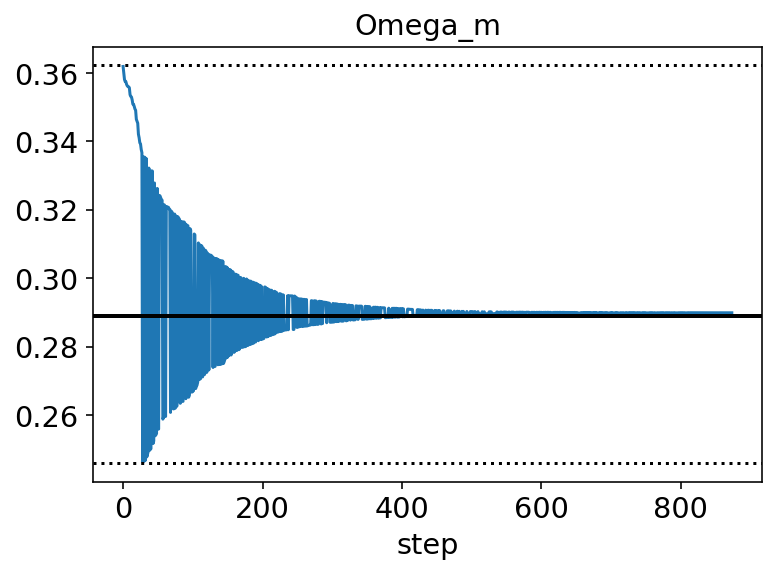

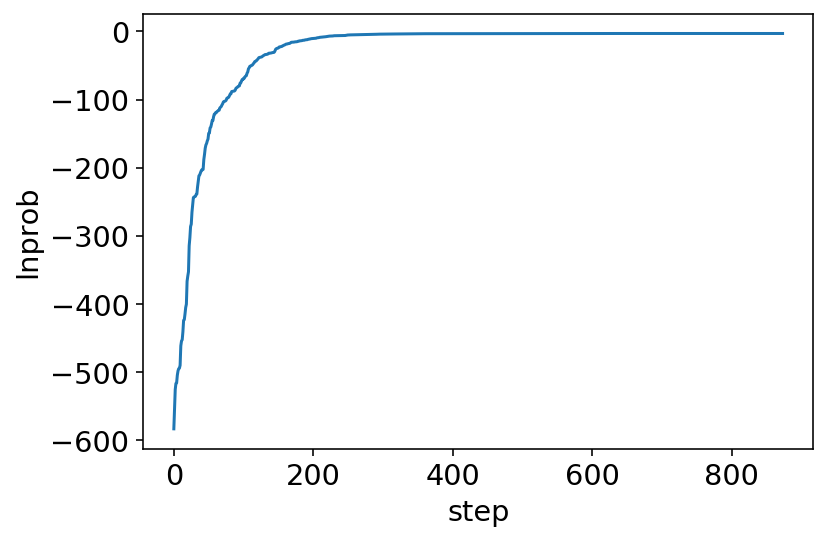

In [12]:
plot_chains('wp_c3h3_omegam_dynesty_dlogz1e-2_nongen')

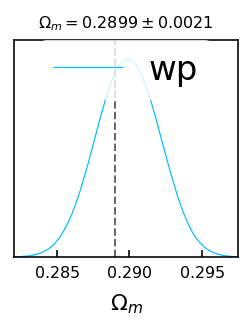

In [14]:
legend_labels = ['wp']
chaintags = ['wp_c3h3_omegam_dynesty_dlogz1e-2_nongen'] #this was only 30 iterations! and it's fine!
figure = plot_contours(chaintags, colors=[cwp], 
                      legend_labels=legend_labels)

774
dict_keys(['nlive', 'niter', 'ncall', 'eff', 'samples', 'samples_id', 'samples_it', 'samples_u', 'logwt', 'logl', 'logvol', 'logz', 'logzerr', 'information', 'bound', 'bound_iter', 'samples_bound', 'scale'])
(874, 1)
[0.2462929]


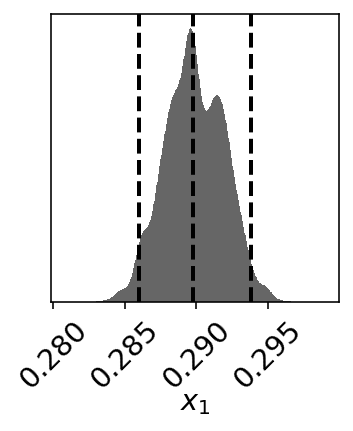

In [17]:
chaintag = 'wp_c3h3_omegam_dynesty_dlogz1e-2_nongen'
pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
with open(pickle_fn, 'rb') as pf:
    res = pickle.load(pf)
    print(res.niter)
    
    dyplot.cornerplot(res)

In [19]:
check_chains('wp_c3h3_omegam-sigma8-f_dynesty_dlogz1e-2_nongen')

wp_c3h3_omegam-sigma8-f_dynesty_dlogz1e-2_nongen: <HDF5 dataset "chain": shape (1, 1373, 3), type "<f4">
dlogz: 1e-2
seed: 12


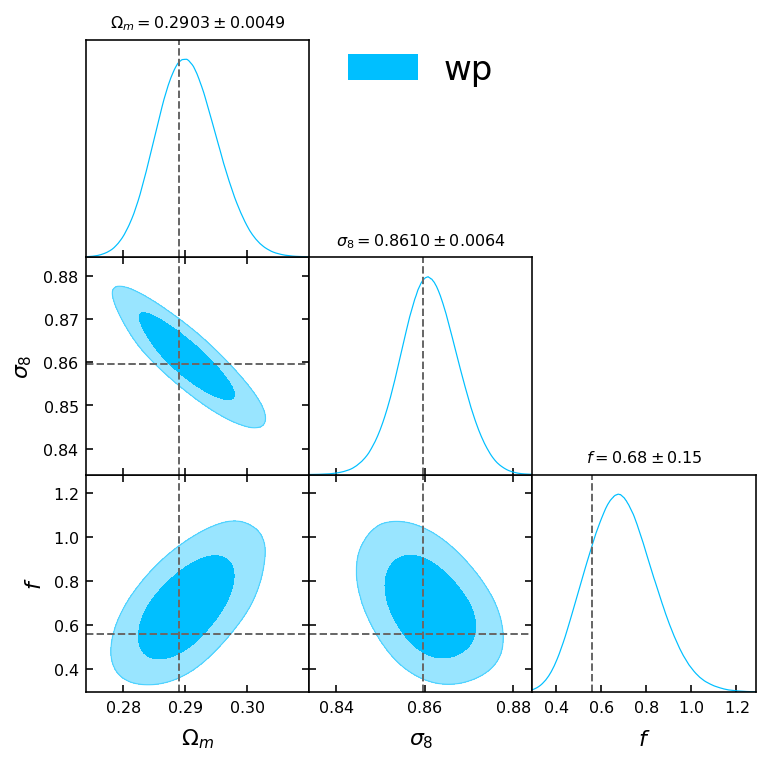

In [18]:
legend_labels = ['wp']
chaintags = ['wp_c3h3_omegam-sigma8-f_dynesty_dlogz1e-2_nongen'] #this was only 30 iterations! and it's fine!
figure = plot_contours(chaintags, colors=[cwp], 
                      legend_labels=legend_labels)

1273
1373
1373
100


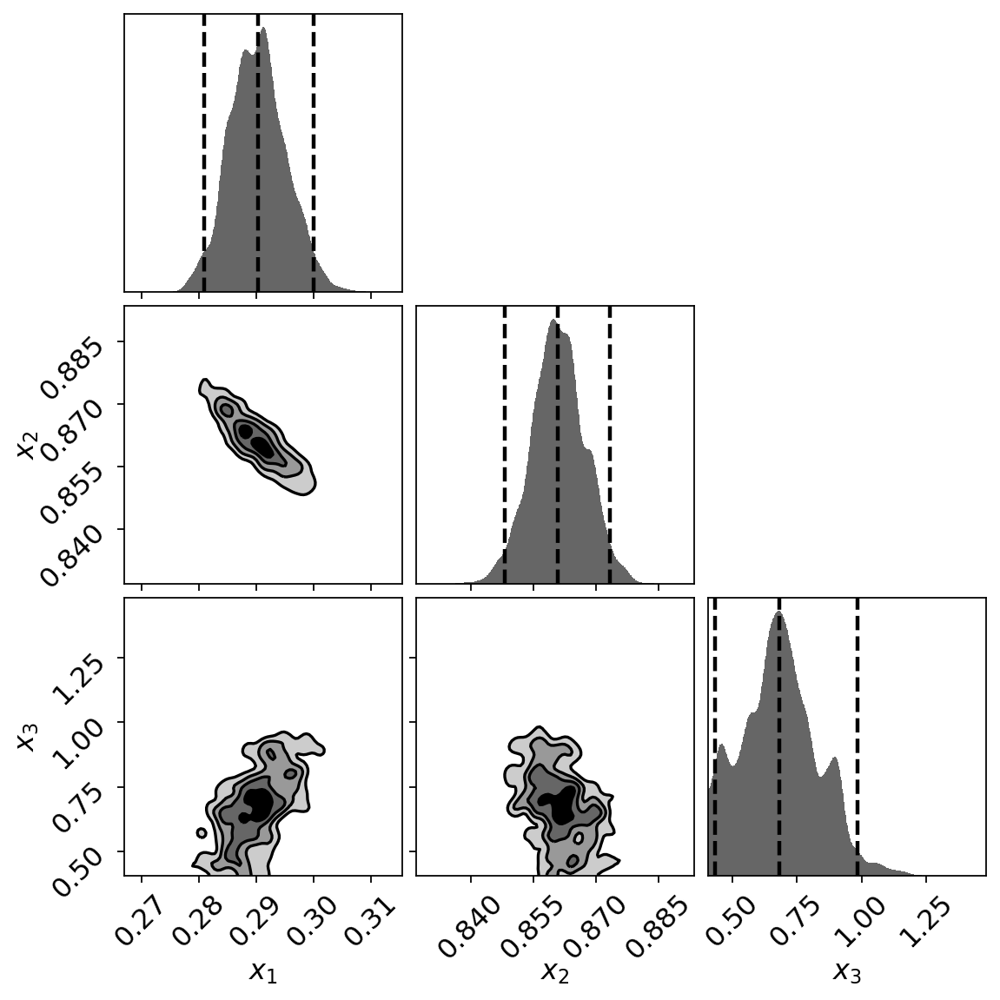

In [26]:
chaintag = 'wp_c3h3_omegam-sigma8-f_dynesty_dlogz1e-2_nongen'
pickle_dir = f'../products/dynesty_results'
pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
with open(pickle_fn, 'rb') as pf:
    res = pickle.load(pf)
    print(res.niter)
    print(len(res.samples))
    print(len(res.ncall))
    print(res.nlive)
    dyplot.cornerplot(res)

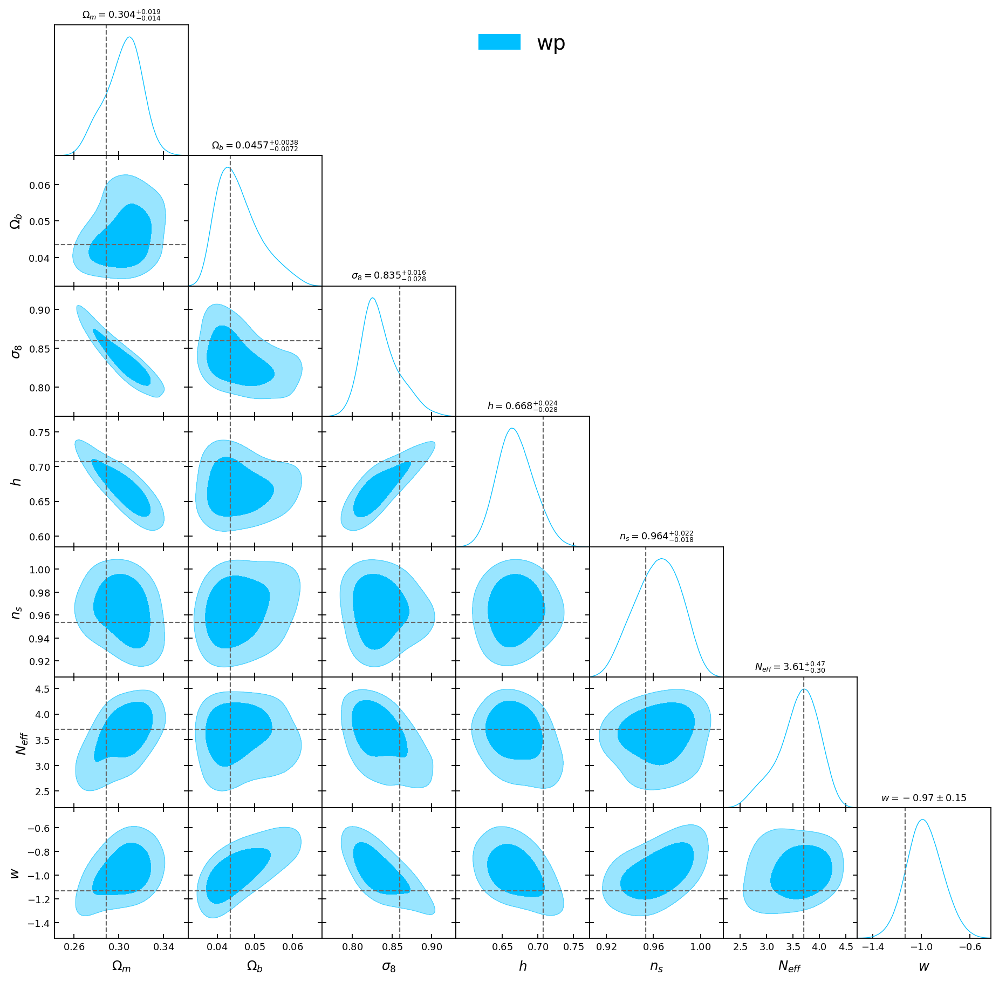

In [27]:
legend_labels = ['wp']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen'] 
figure = plot_contours(chaintags, colors=[cwp], 
                      legend_labels=legend_labels)

In [13]:
check_chains('wp_c3h3_allcosmo-Msat_dynesty_dlogz1e-2_nongen')

wp_c3h3_allcosmo-Msat_dynesty_dlogz1e-2_nongen: <HDF5 dataset "chain": shape (1, 4703, 8), type "<f4">
dlogz: 1e-2
seed: 12


Why is just adding alpha (to allcosmo, Msat) making it take so much longer? x2? 

<HDF5 dataset "chain": shape (1, 4703, 8), type "<f4">


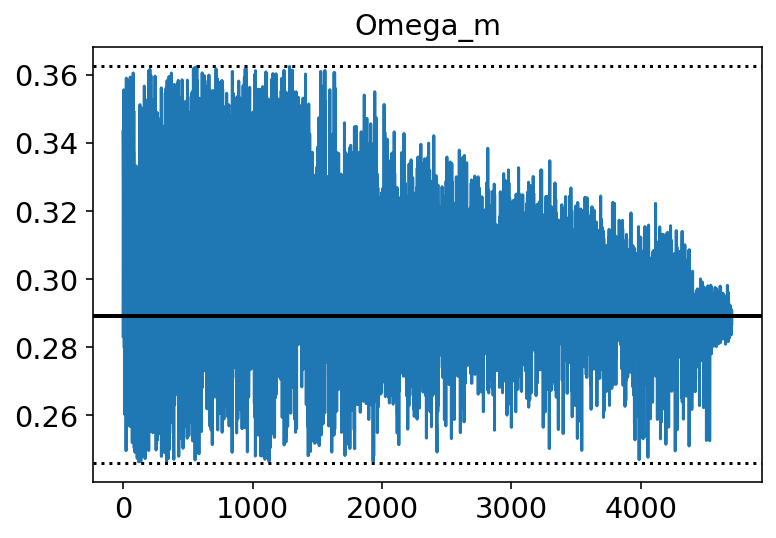

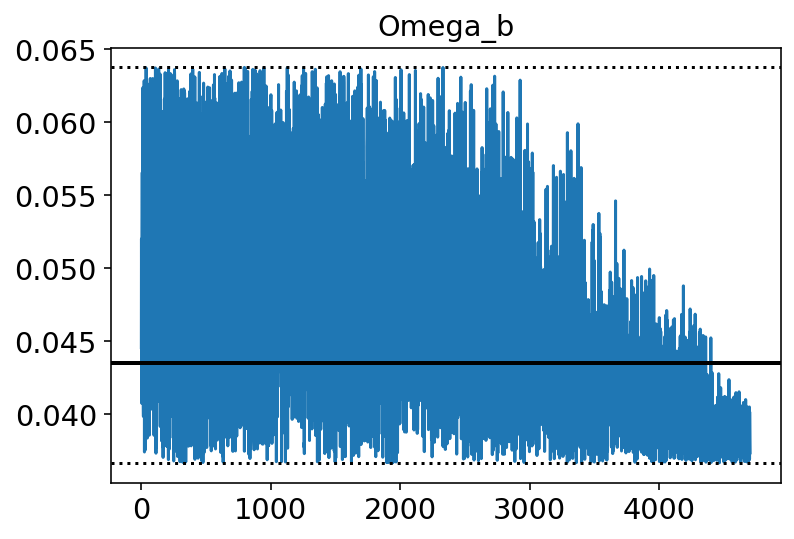

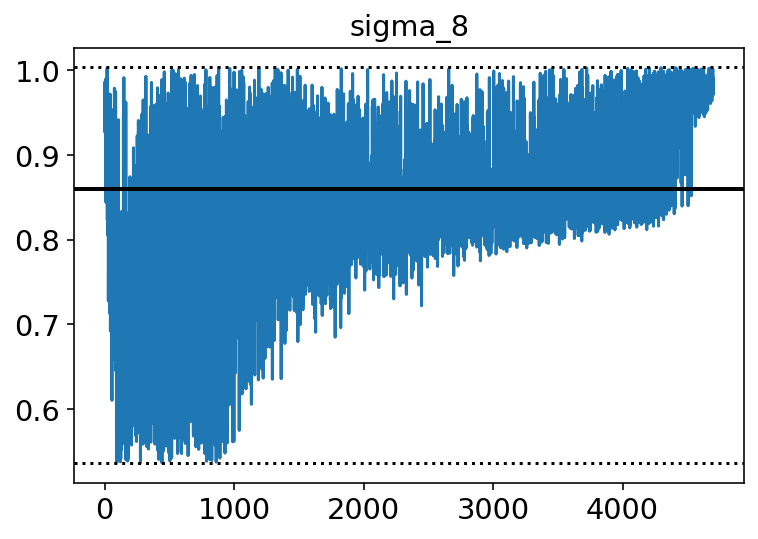

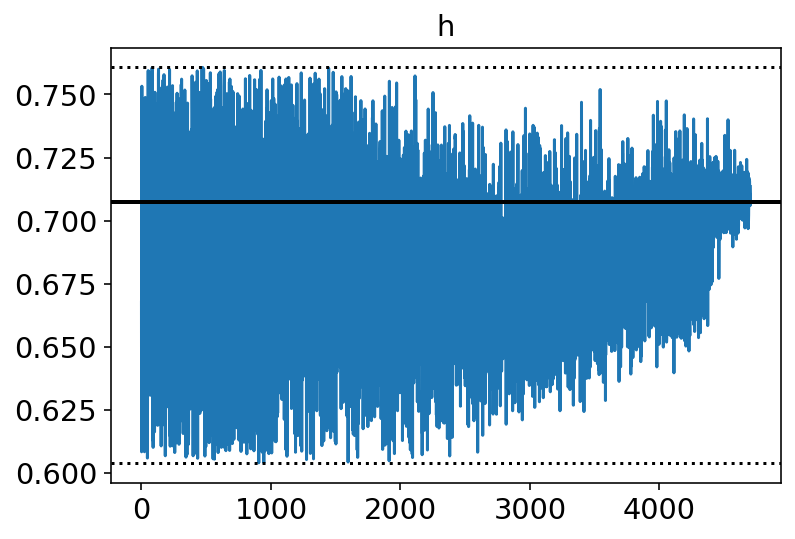

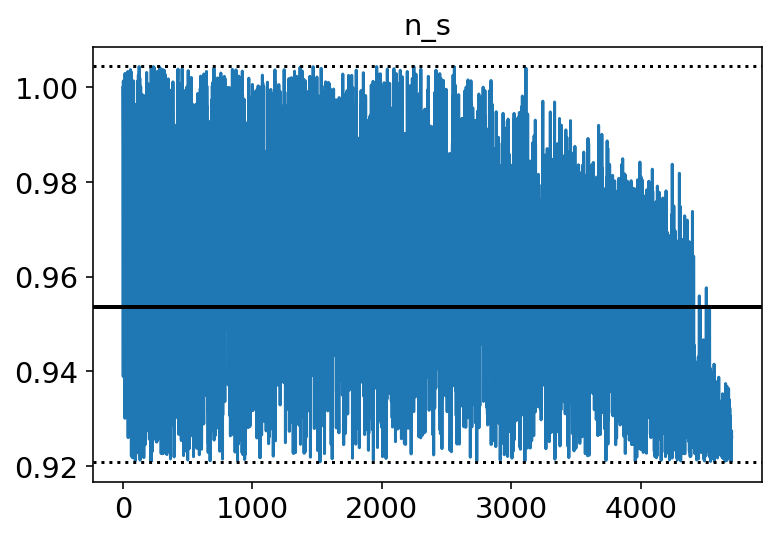

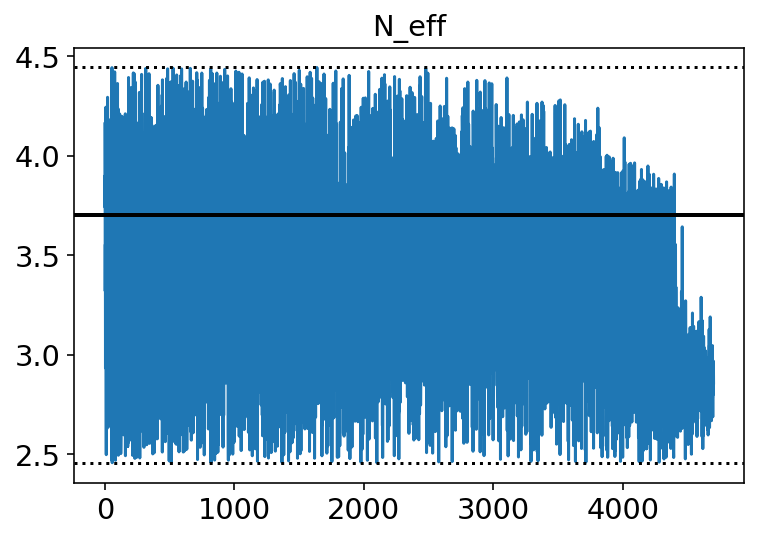

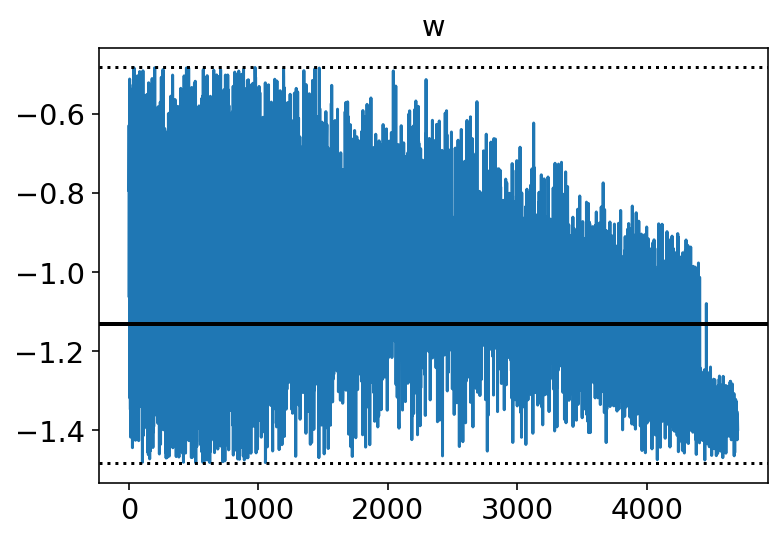

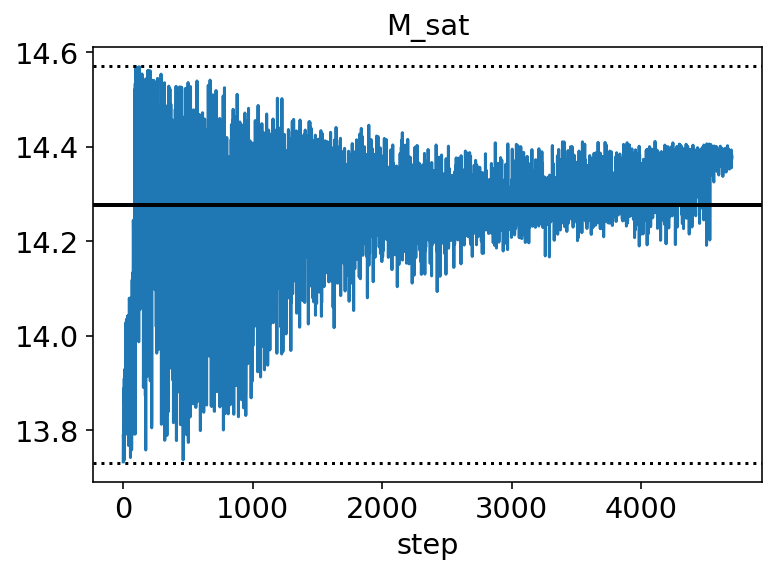

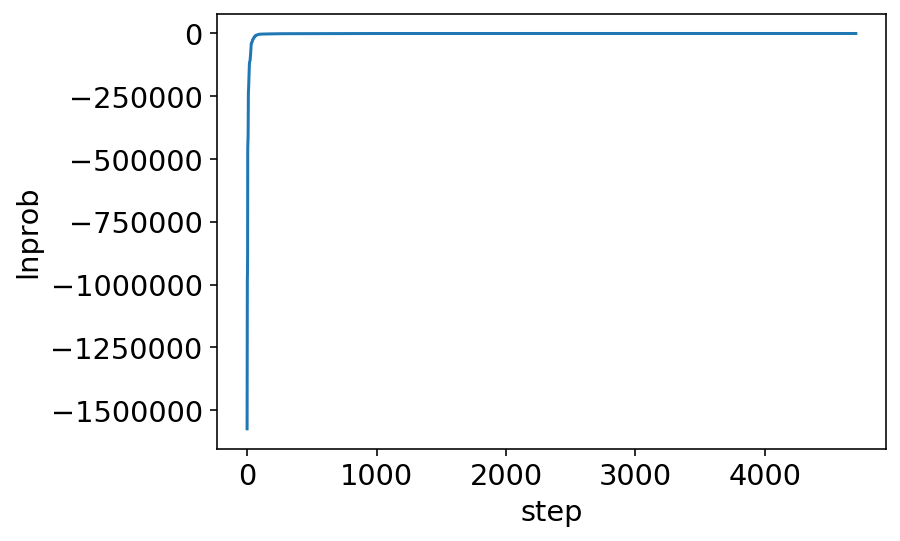

In [15]:
plot_chains('wp_c3h3_allcosmo-Msat_dynesty_dlogz1e-2_nongen')

<HDF5 dataset "chain": shape (1, 5050, 8), type "<f4">


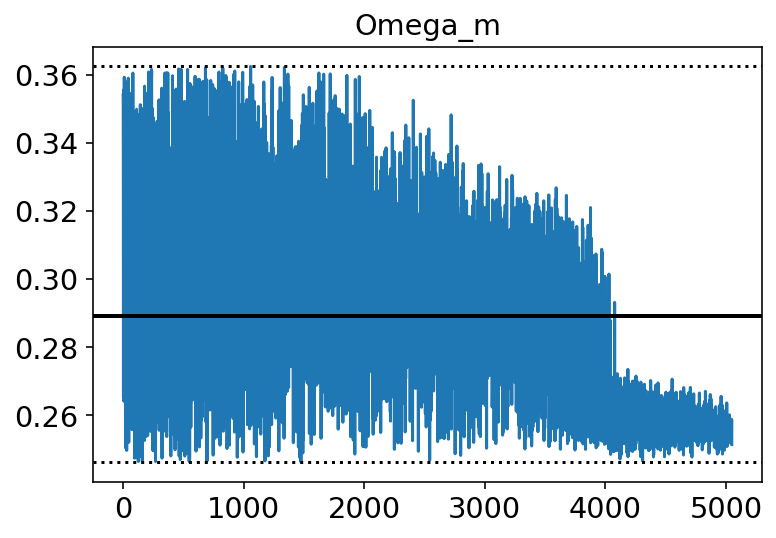

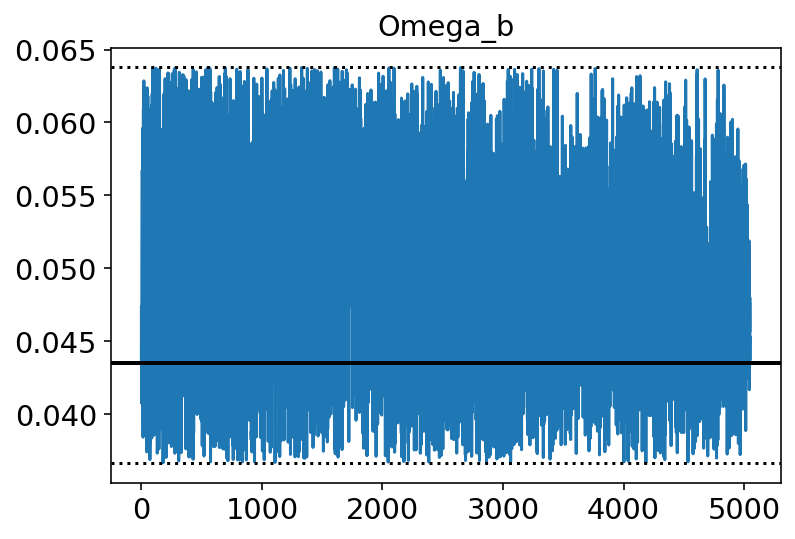

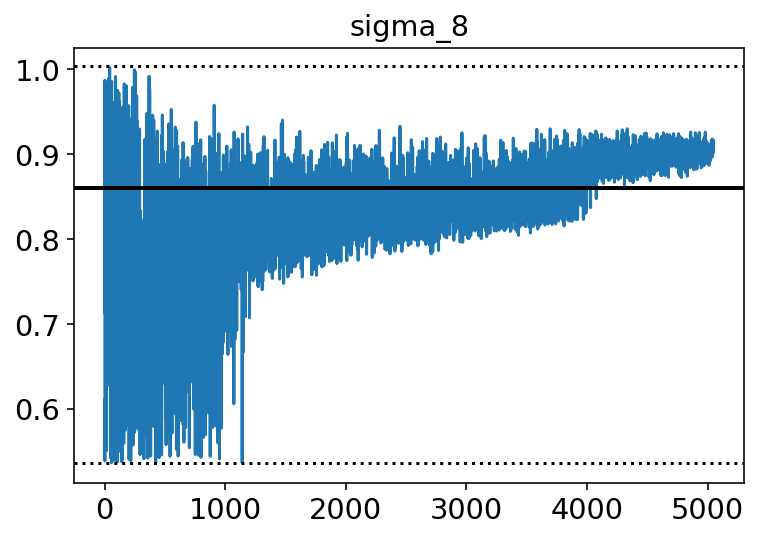

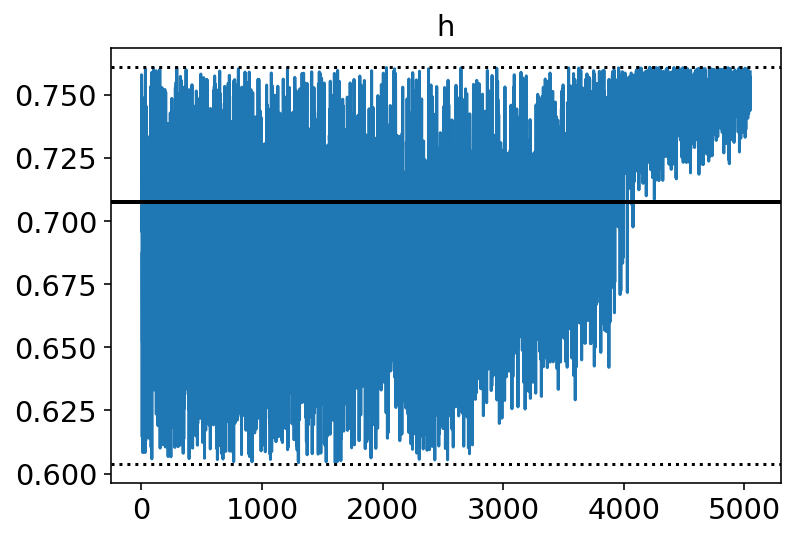

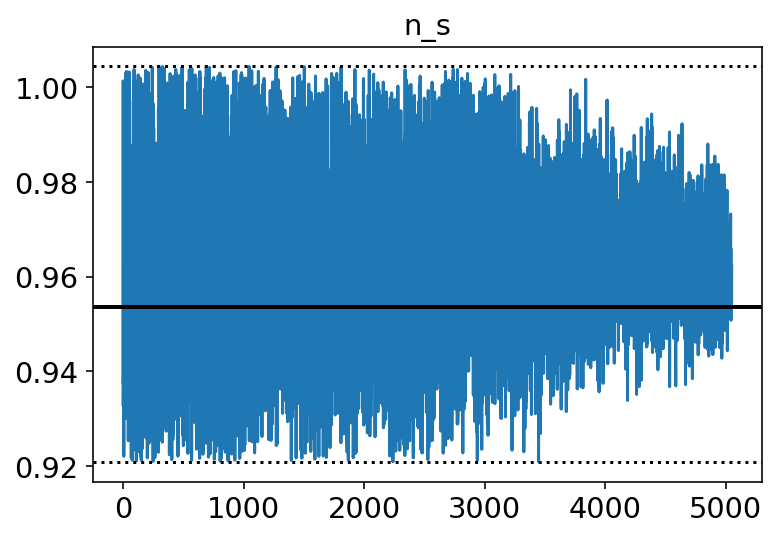

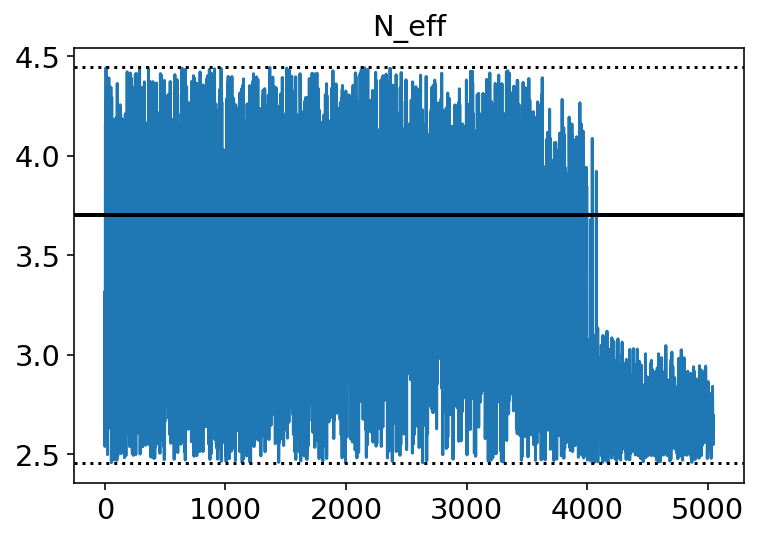

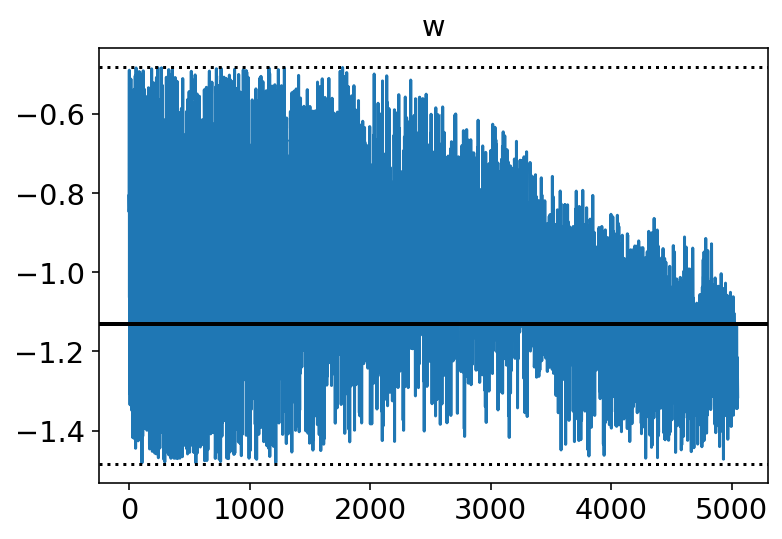

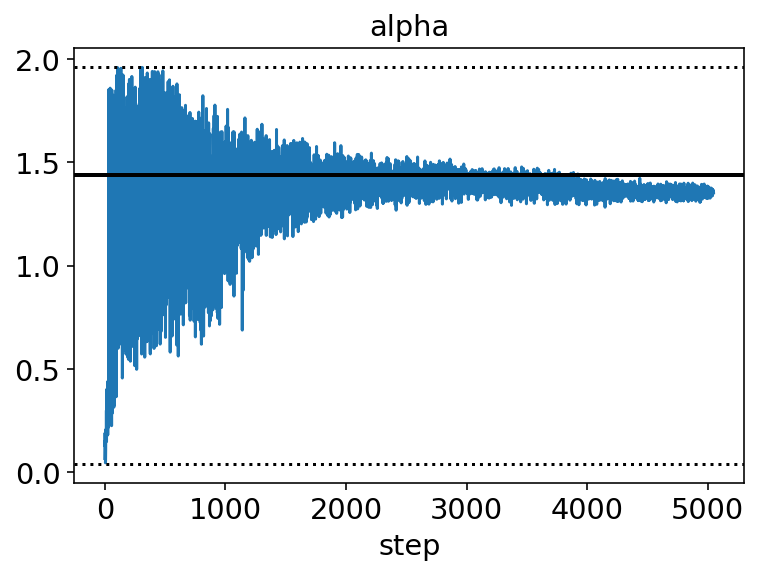

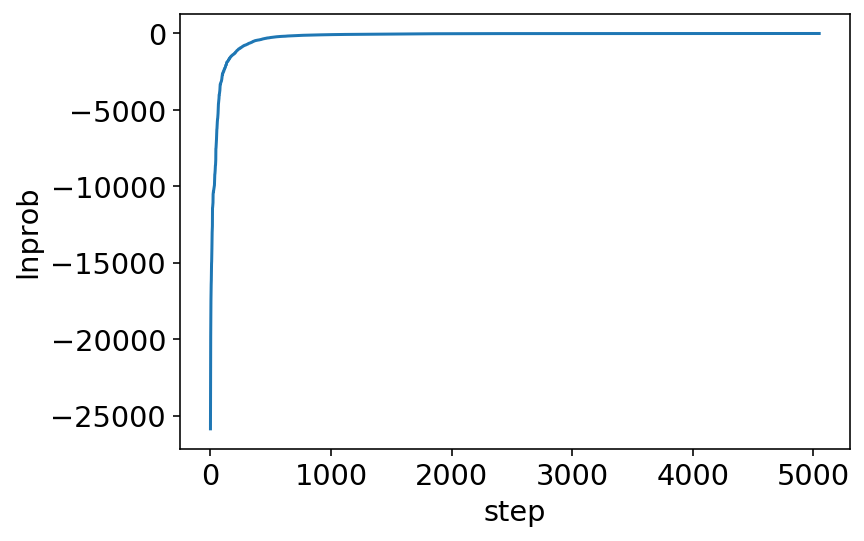

In [19]:
plot_chains('wp_c3h3_allcosmo-alpha_dynesty_dlogz1e-2_nongen')

<HDF5 dataset "chain": shape (1, 6518, 9), type "<f4">


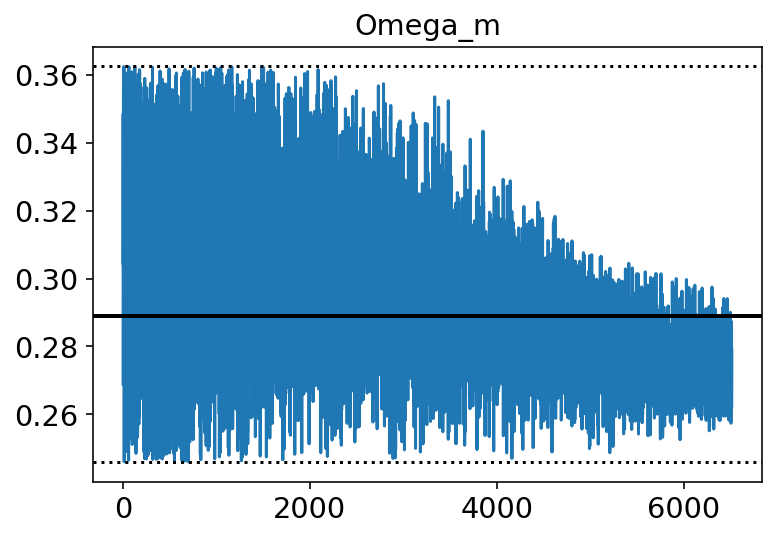

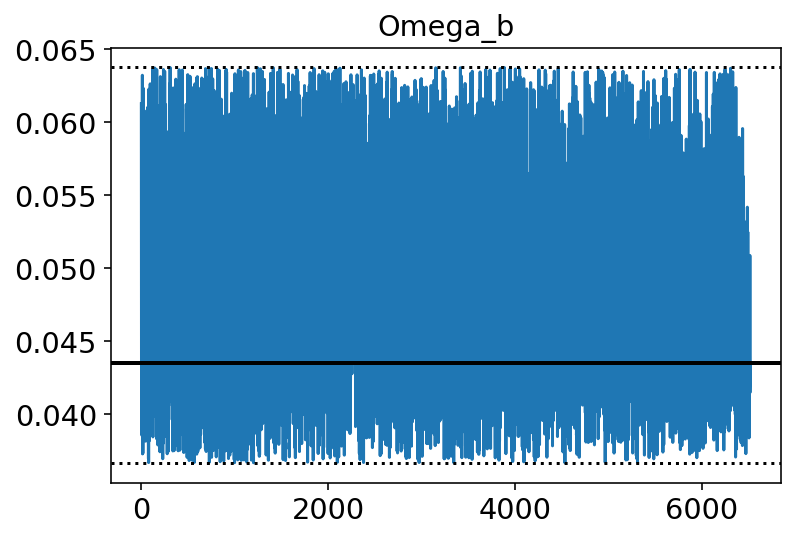

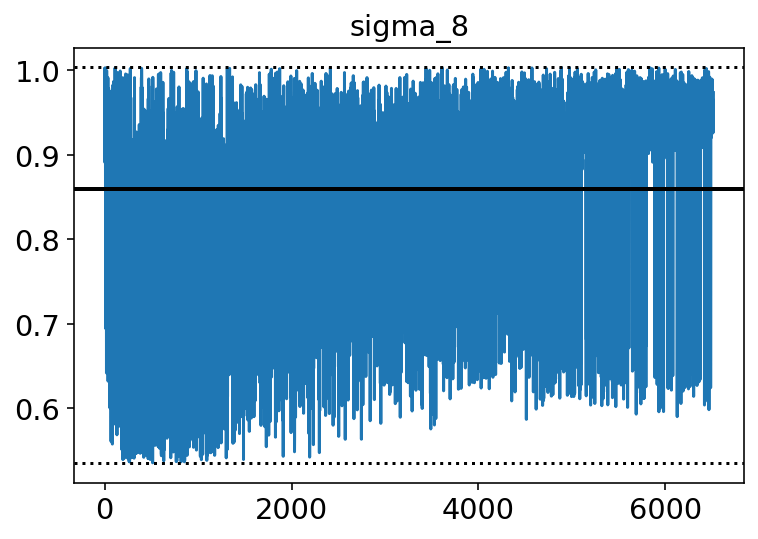

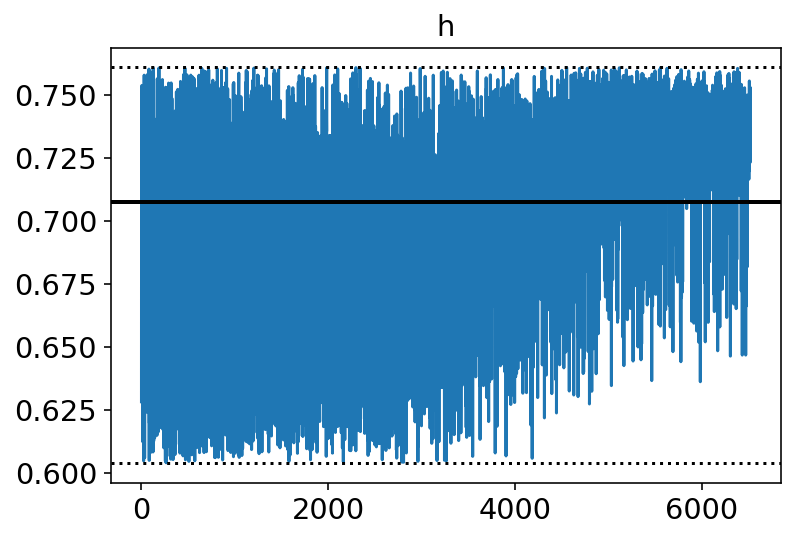

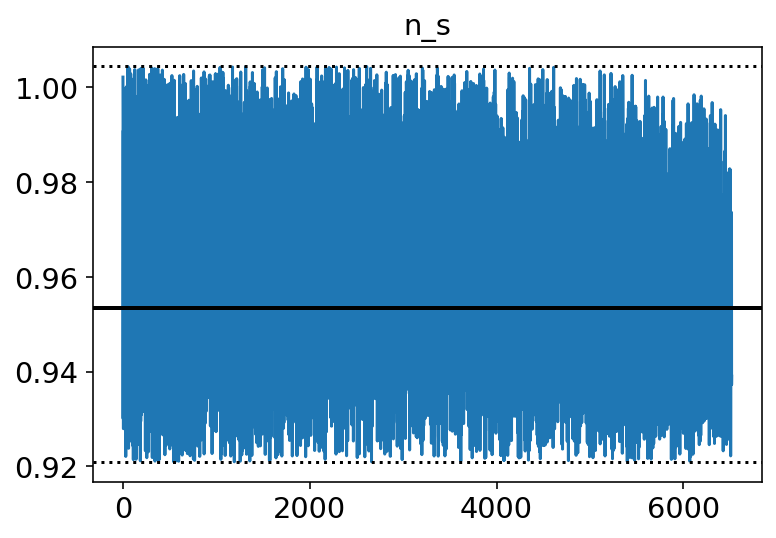

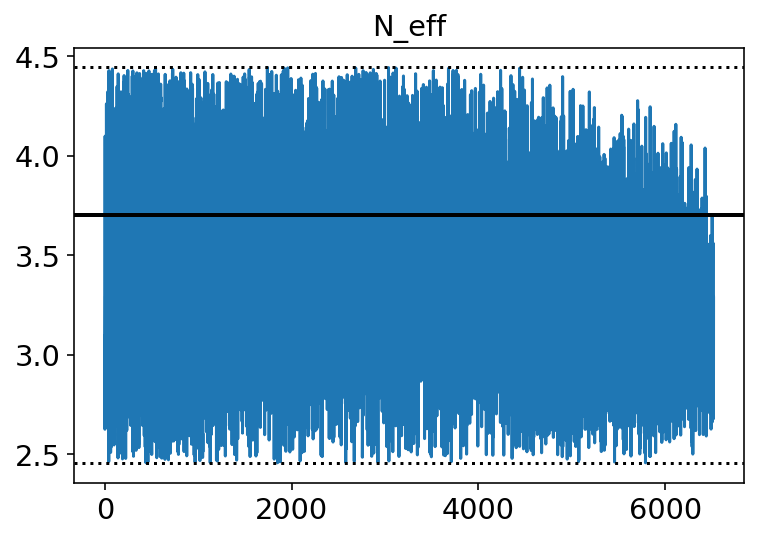

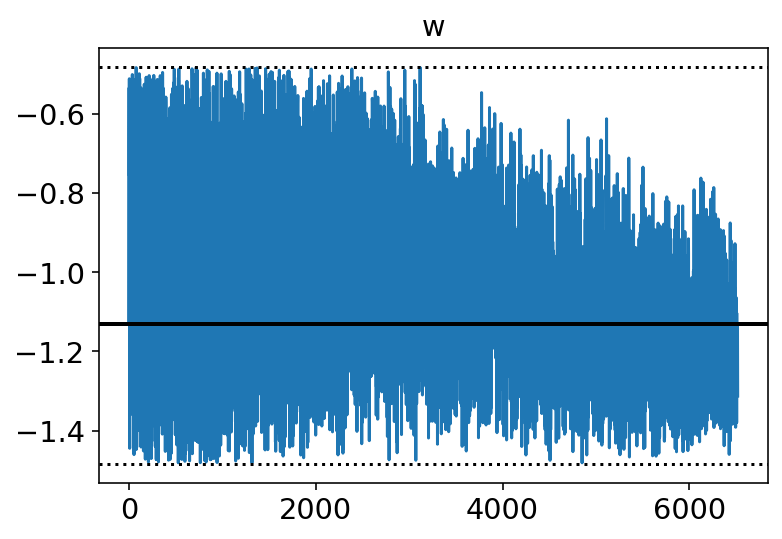

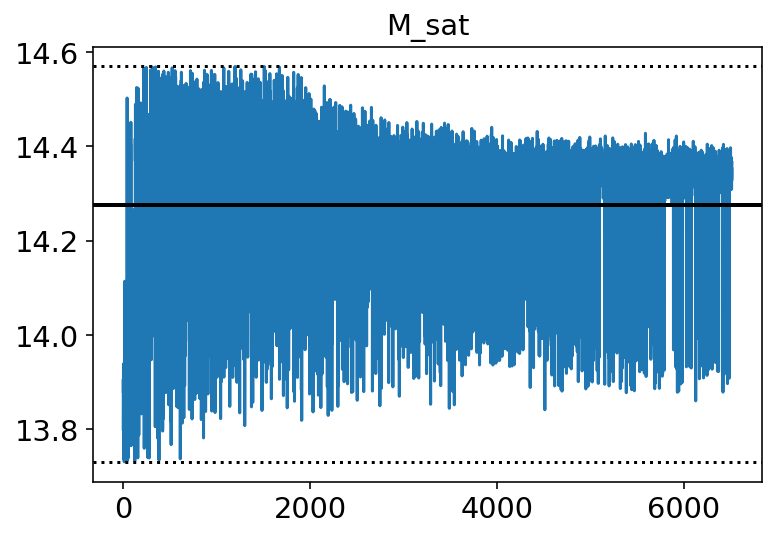

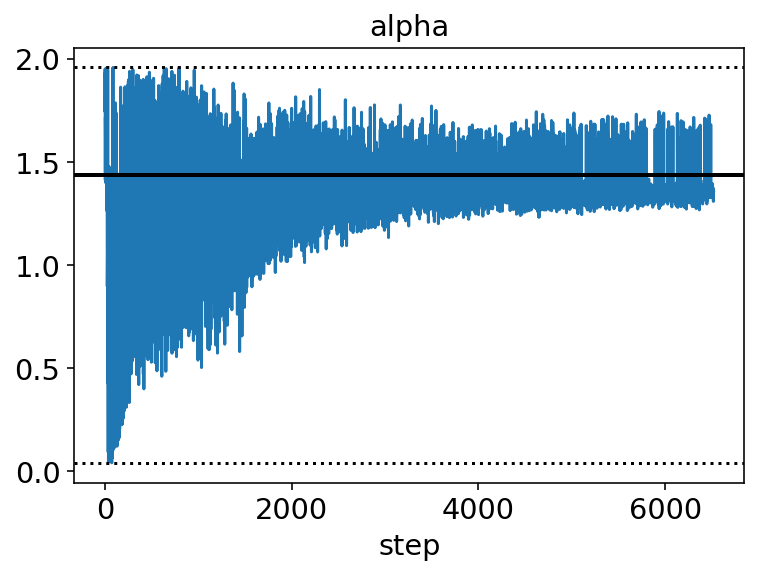

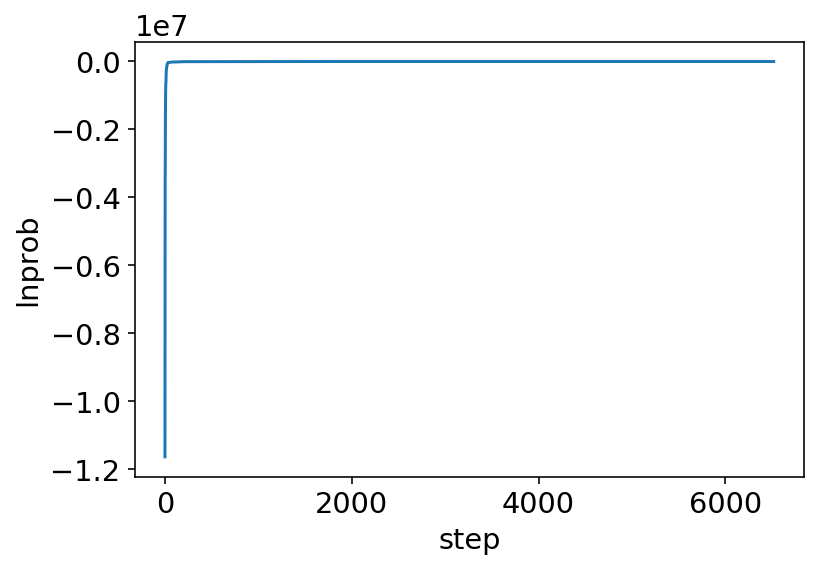

In [18]:
plot_chains('wp_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen')

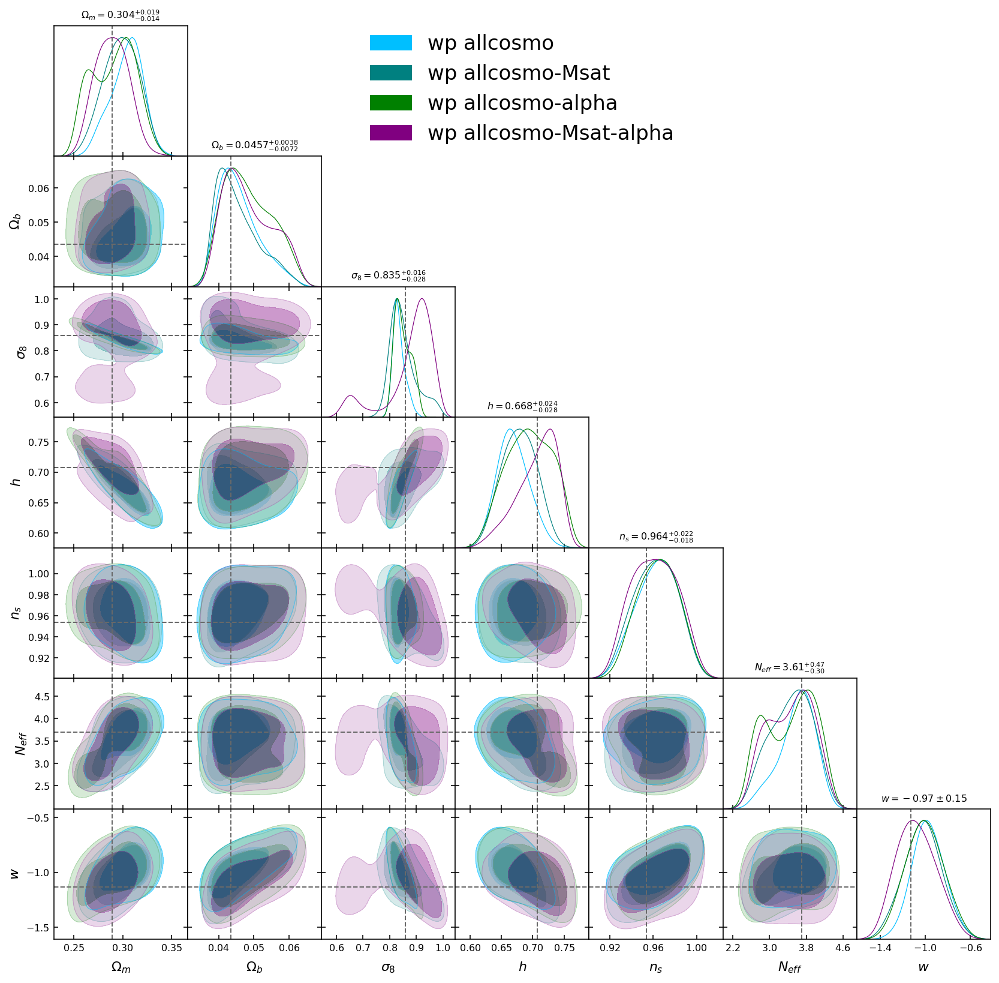

In [16]:
legend_labels = ['wp allcosmo', 
                 'wp allcosmo-Msat',
                 'wp allcosmo-alpha',
                 'wp allcosmo-Msat-alpha']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen',
             'wp_c3h3_allcosmo-Msat_dynesty_dlogz1e-2_nongen',
             'wp_c3h3_allcosmo-alpha_dynesty_dlogz1e-2_nongen',
             'wp_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen'] 
colors = [cwp, 'teal', 'green', 'purple']
figure = plot_contours(chaintags, colors=colors, params_toplot=cosmo_params,
                      legend_labels=legend_labels)

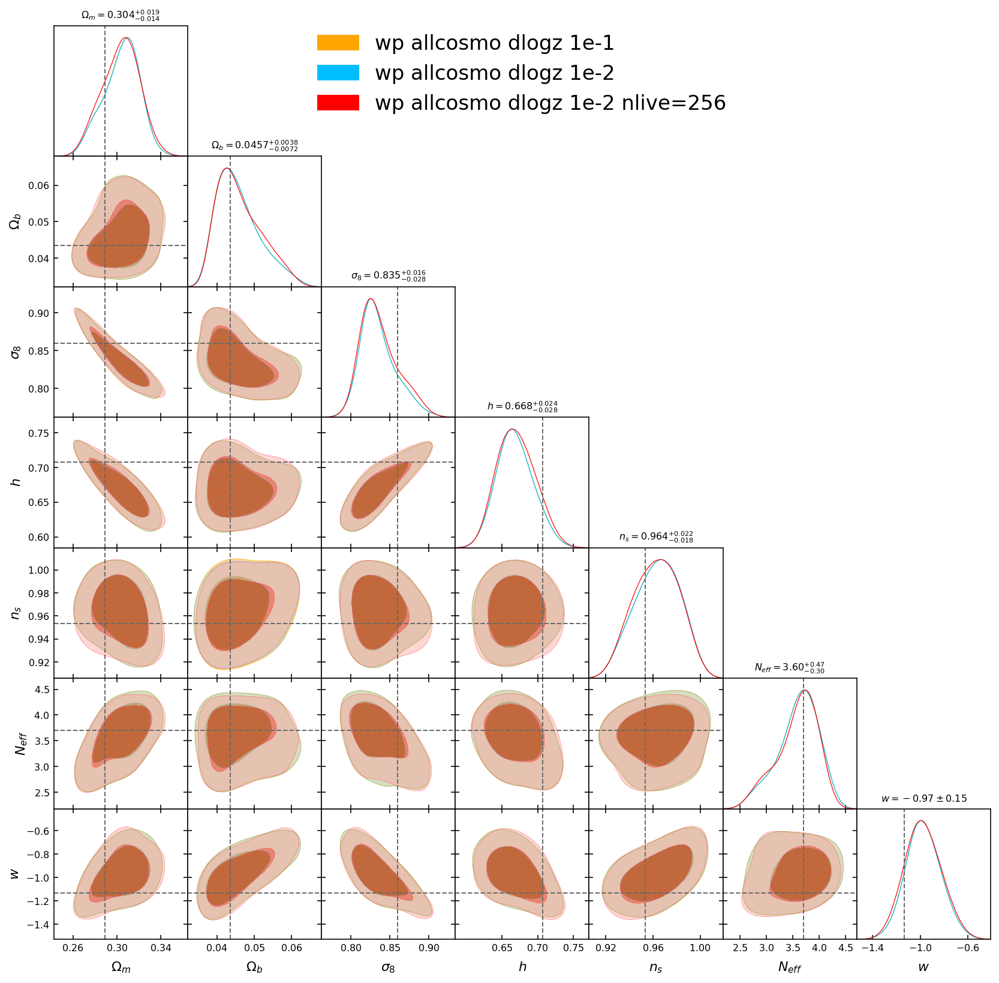

In [17]:
legend_labels = ['wp allcosmo dlogz 1e-1', 
                 'wp allcosmo dlogz 1e-2',
                 'wp allcosmo dlogz 1e-2 nlive=256']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-1_nongen',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_nlive256'] 
colors = ['orange', cwp, 'red']
figure = plot_contours(chaintags, colors=colors, params_toplot=cosmo_params,
                      legend_labels=legend_labels)

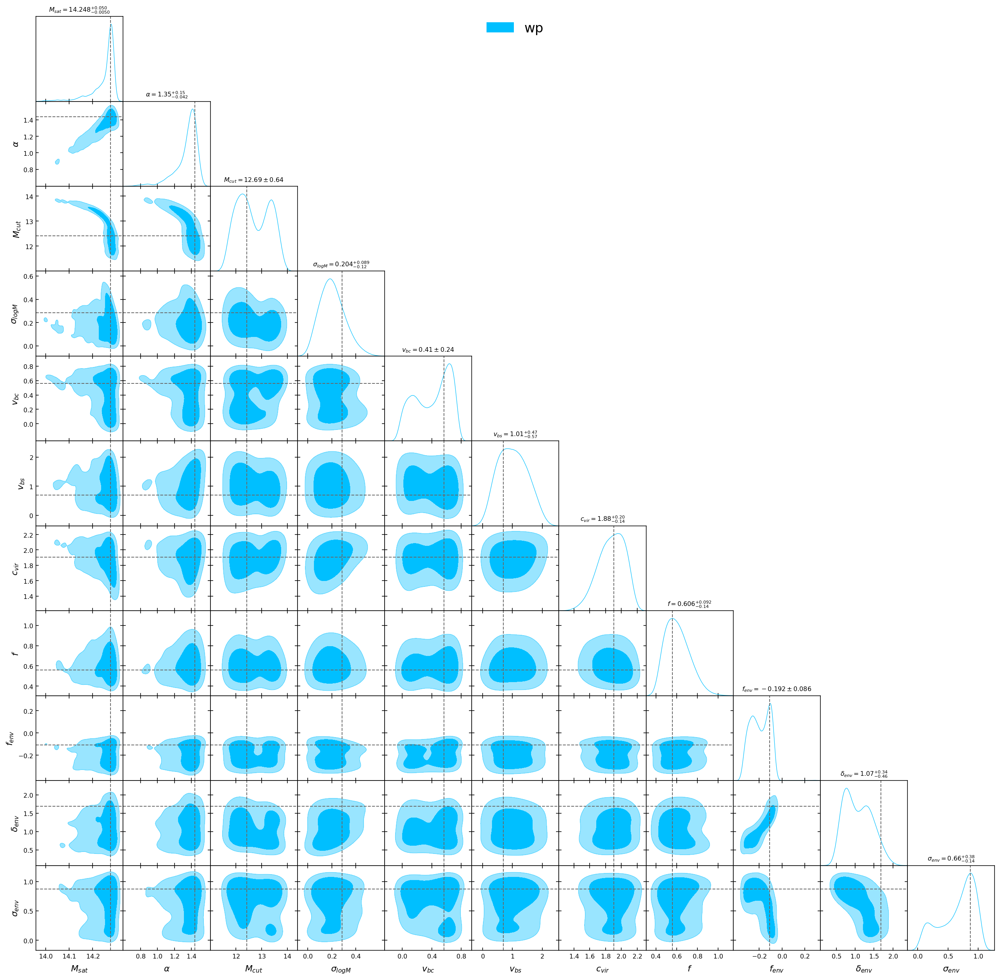

In [12]:
legend_labels = ['wp']
chaintags = ['wp_c3h3_allhod_dynesty_dlogz1e-2_nongen'] 
figure = plot_contours(chaintags, colors=[cwp], 
                      legend_labels=legend_labels)

# hpriorg (hypercube prior, gaussian)

In [20]:
# run when chain finishes
legend_labels = ['wp']
chaintags = ['wp_c3h3_omegam-sigma8-f_dynesty_dlogz1e-2_nongen_hpriorg']
figure = plot_contours(chaintags, colors=[cwp], 
                      legend_labels=legend_labels)

OSError: Unable to open file (unable to open file: name = '../chains/chains_wp_c3h3_omegam-sigma8-f_dynesty_dlogz1e-2_nongen_hpriorg.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

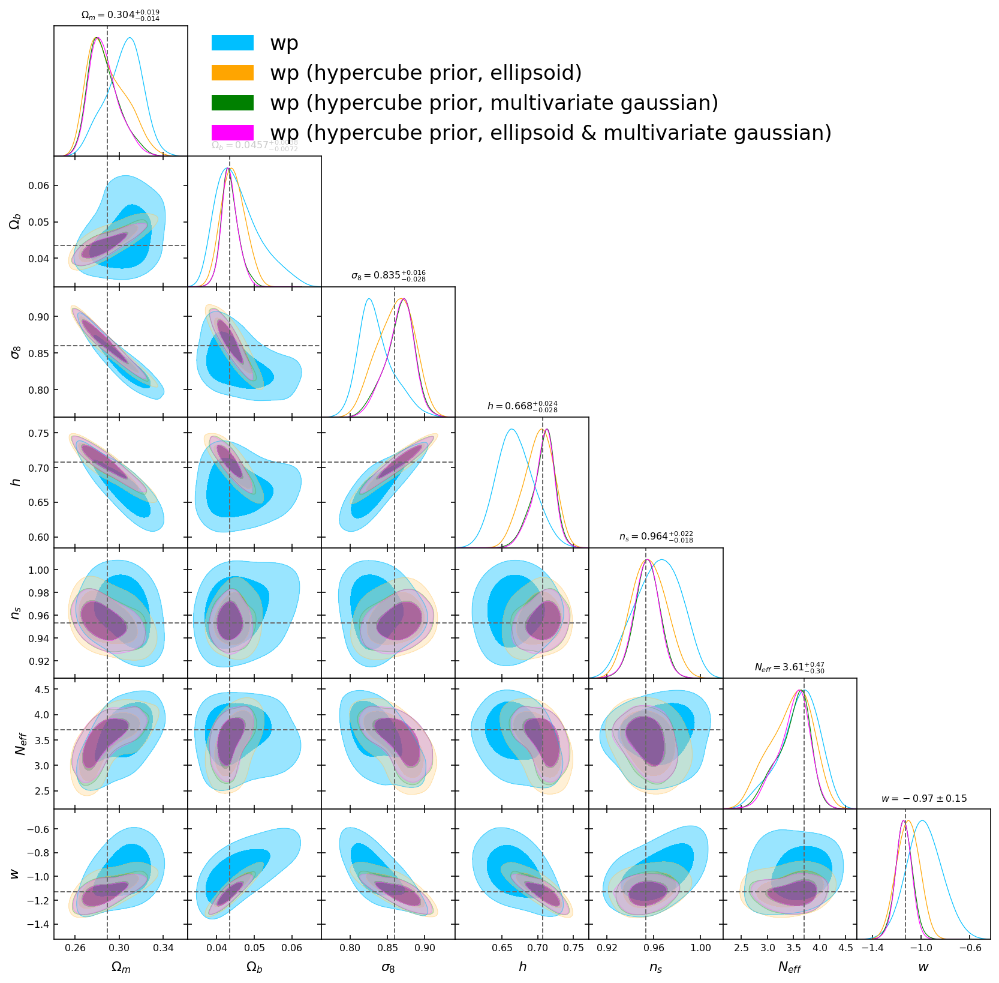

In [16]:
legend_labels = ['wp',
                 'wp (hypercube prior, ellipsoid)',
                 'wp (hypercube prior, multivariate gaussian)',
                 'wp (hypercube prior, ellipsoid & multivariate gaussian)']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hprior',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorgl']
colors = [cwp, 'orange', 'green', 'magenta']
figure = plot_contours(chaintags, colors=colors, 
                      legend_labels=legend_labels)

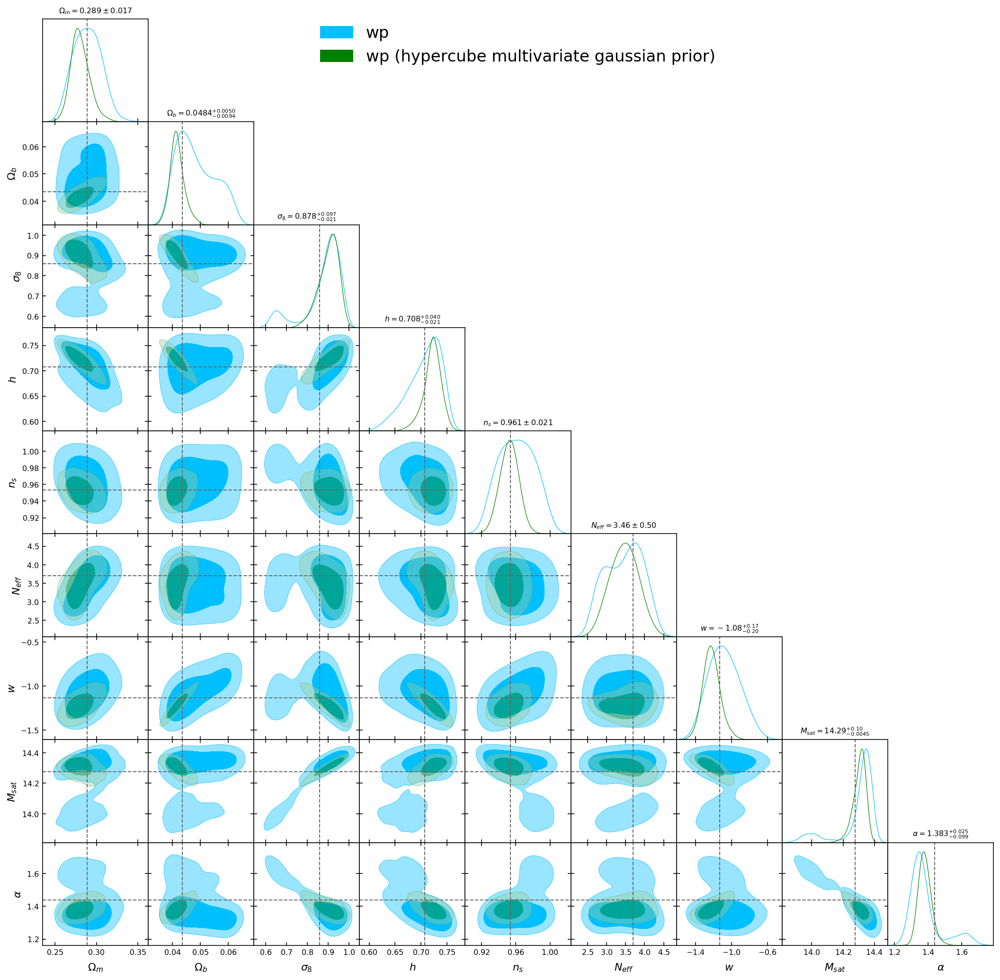

In [11]:
legend_labels = ['wp',
                 'wp (hypercube multivariate gaussian prior)']
chaintags = ['wp_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen',
             'wp_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp, 'green']
figure = plot_contours(chaintags, colors=colors, 
                      legend_labels=legend_labels)

In [24]:
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg')
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_nongen_hprior')
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_hprior')
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_nongen')
check_chains('wp_c3h3_all_dynesty_dlogz001')

wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg: <HDF5 dataset "chain": shape (1, 27912, 18), type "<f4">
dlogz: 1e-2
seed: 12
chain ../chains/chains_wp_c3h3_all_dynesty_dlogz1e-2_nongen_hprior.h5 doesn't exist!
wp_c3h3_all_dynesty_dlogz1e-2_hprior: <HDF5 dataset "chain": shape (0, 0, 18), type "<f4">
dlogz: 1e-2
seed: 12
wp_c3h3_all_dynesty_dlogz1e-2_nongen: <HDF5 dataset "chain": shape (0, 0, 18), type "<f4">
dlogz: 1e-2
seed: 12
wp_c3h3_all_dynesty_dlogz001: <HDF5 dataset "chain": shape (1, 12100, 18), type "<f4">
dlogz: 0.001


KeyError: "Can't open attribute (can't locate attribute: 'seed')"

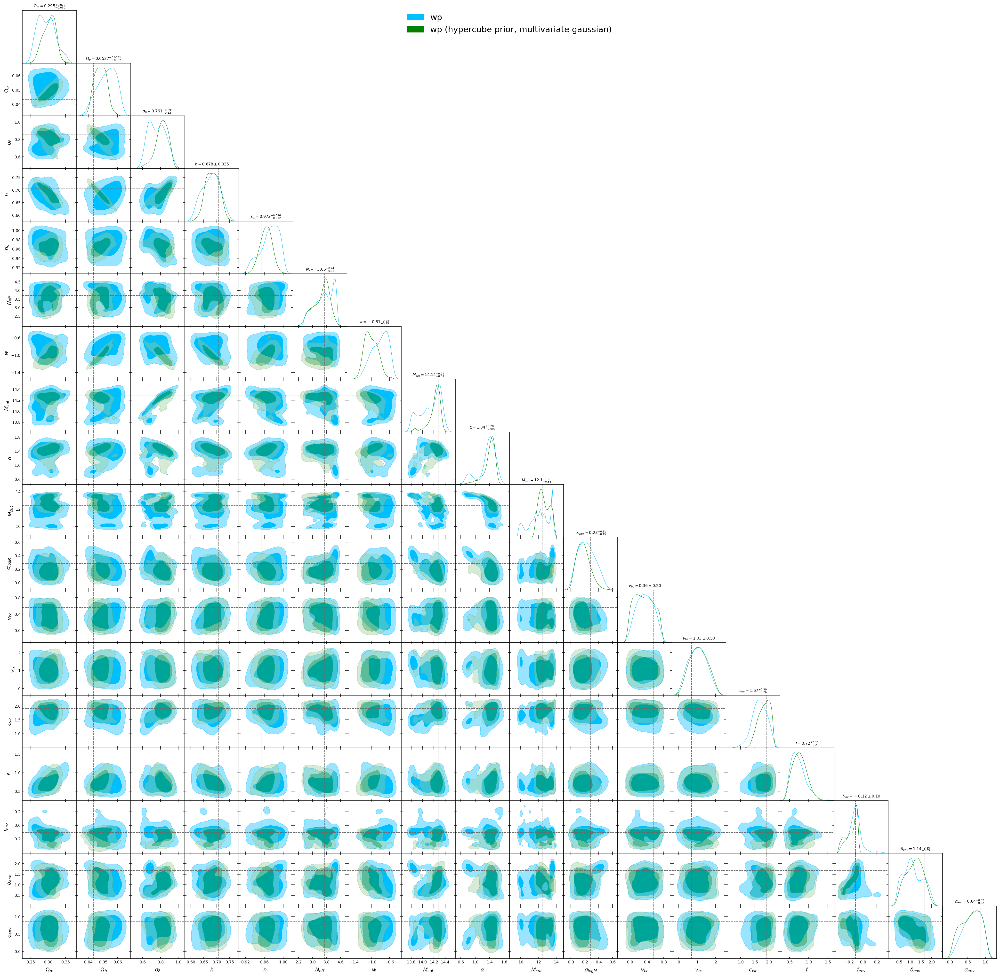

In [23]:
legend_labels = ['wp',
                 'wp (hypercube prior, multivariate gaussian)']
chaintags = ['wp_c3h3_all_dynesty_dlogz001',
             'wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp, 'green']
figure = plot_contours(chaintags, colors=colors, 
                      legend_labels=legend_labels)

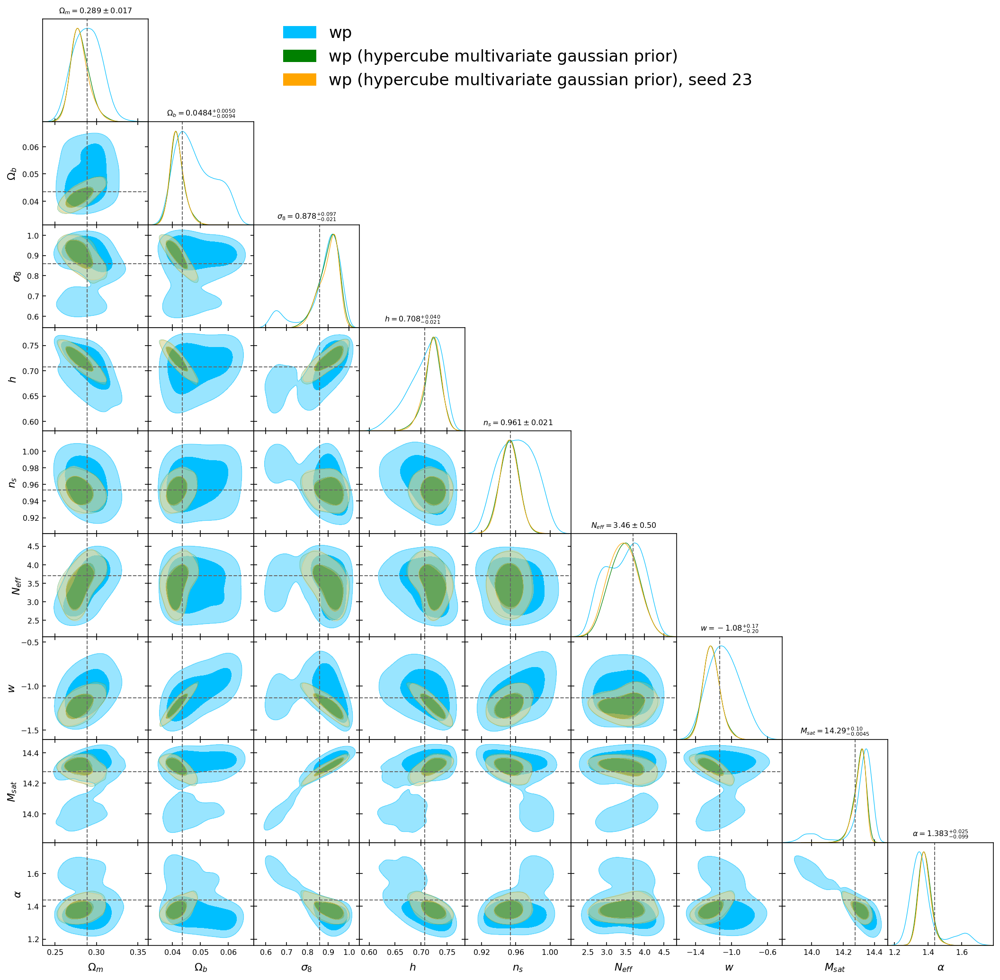

In [26]:
legend_labels = ['wp',
                 'wp (hypercube multivariate gaussian prior)',
                 'wp (hypercube multivariate gaussian prior), seed 23']
chaintags = ['wp_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen',
             'wp_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen_hpriorg_seed23']
colors = [cwp, 'green', 'orange']
figure = plot_contours(chaintags, colors=colors, 
                      legend_labels=legend_labels)

## wp and xi

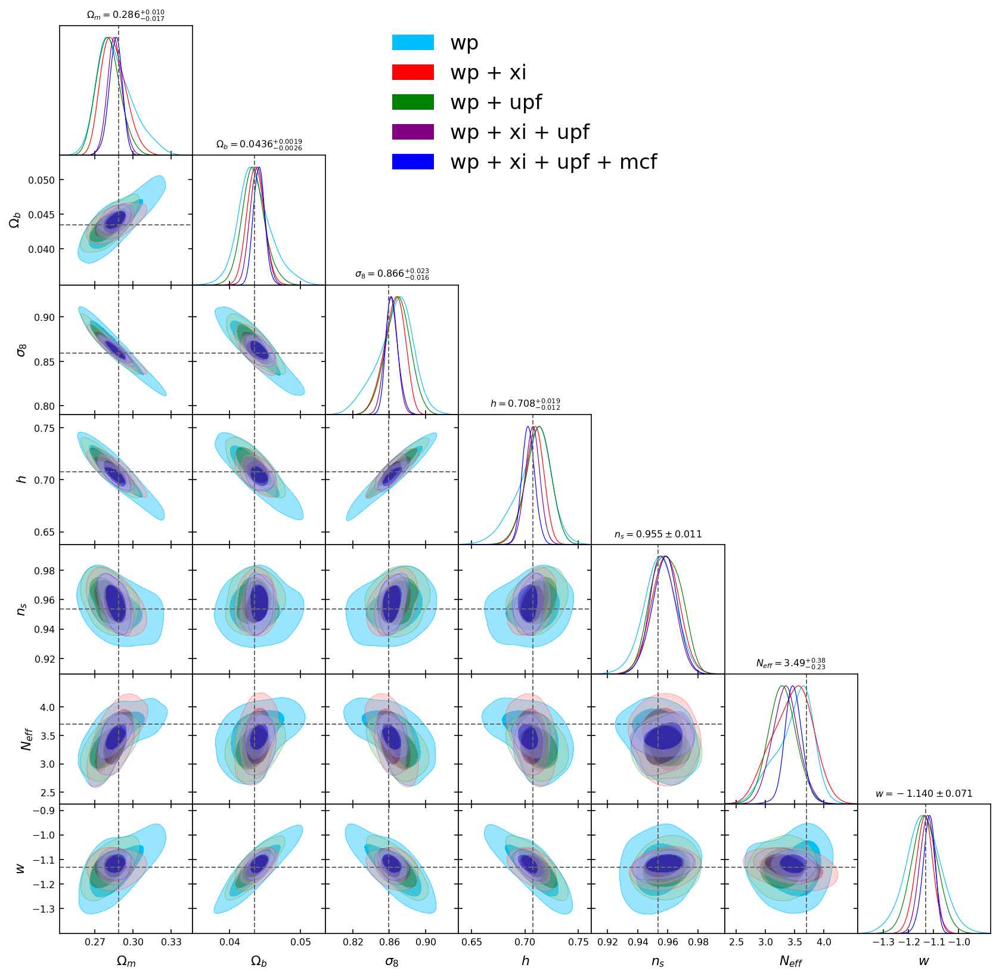

In [18]:
legend_labels = ['wp',
                 'wp + xi',
                 'wp + upf',
                 'wp + xi + upf',
                 'wp + xi + upf + mcf']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_upf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp, 'red', 'green', 'purple', 'blue']
figure = plot_contours(chaintags, colors=colors, 
                      legend_labels=legend_labels)

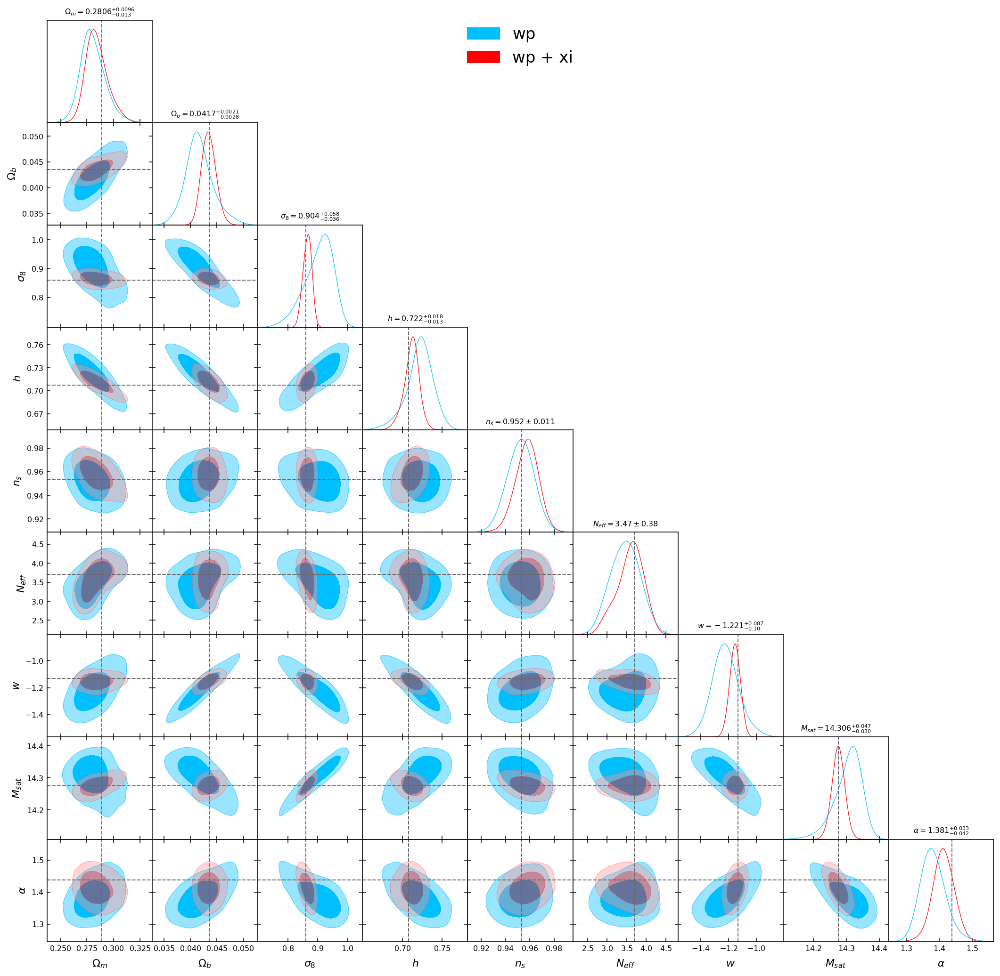

In [13]:
legend_labels = ['wp',
                 'wp + xi']
chaintags = ['wp_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_c3h3_allcosmo-Msat-alpha_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp, 'red']
figure = plot_contours(chaintags, colors=colors, 
                      legend_labels=legend_labels)

# all parameters

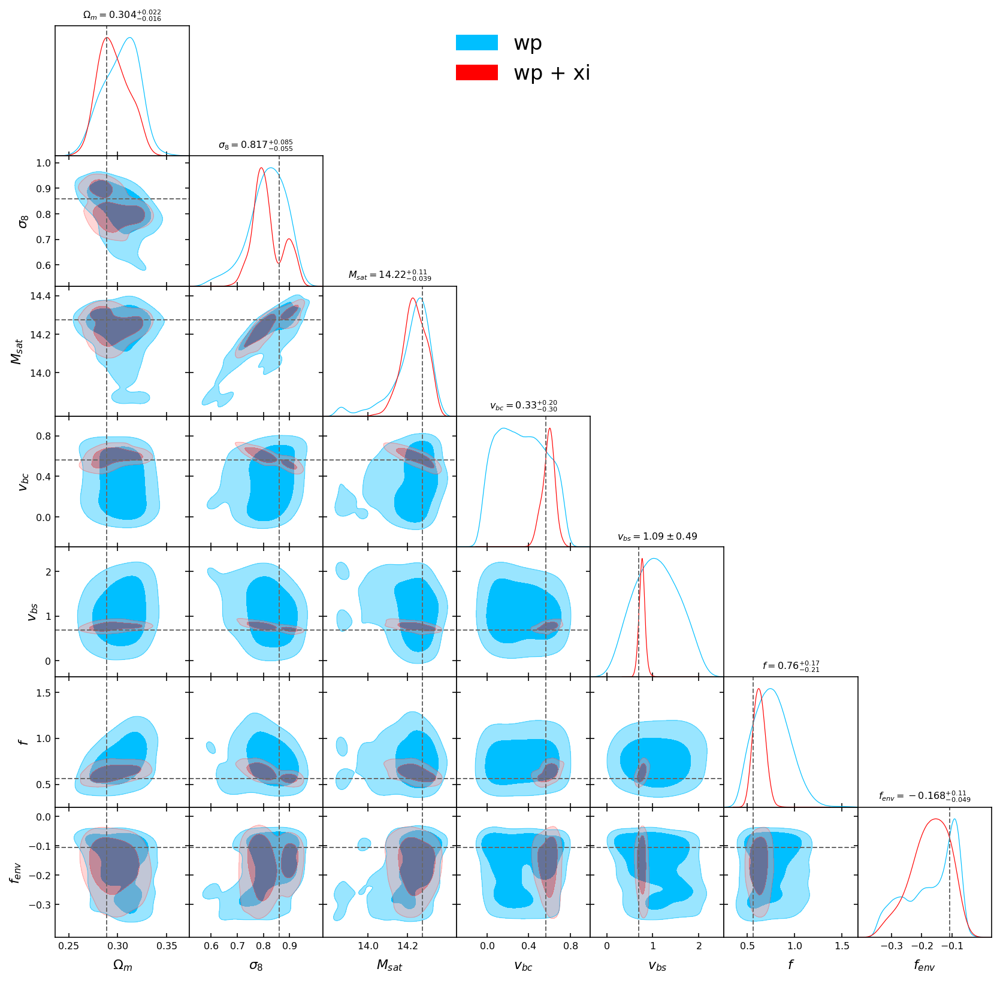

In [11]:
legend_labels = ['wp',
                 'wp + xi']
chaintags = ['wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp, 'red']
figure = plot_contours(chaintags, colors=colors, params_toplot=key_params,
                      legend_labels=legend_labels)

uh what's with this bimodality

# back to gen, dont understand why so much faster...

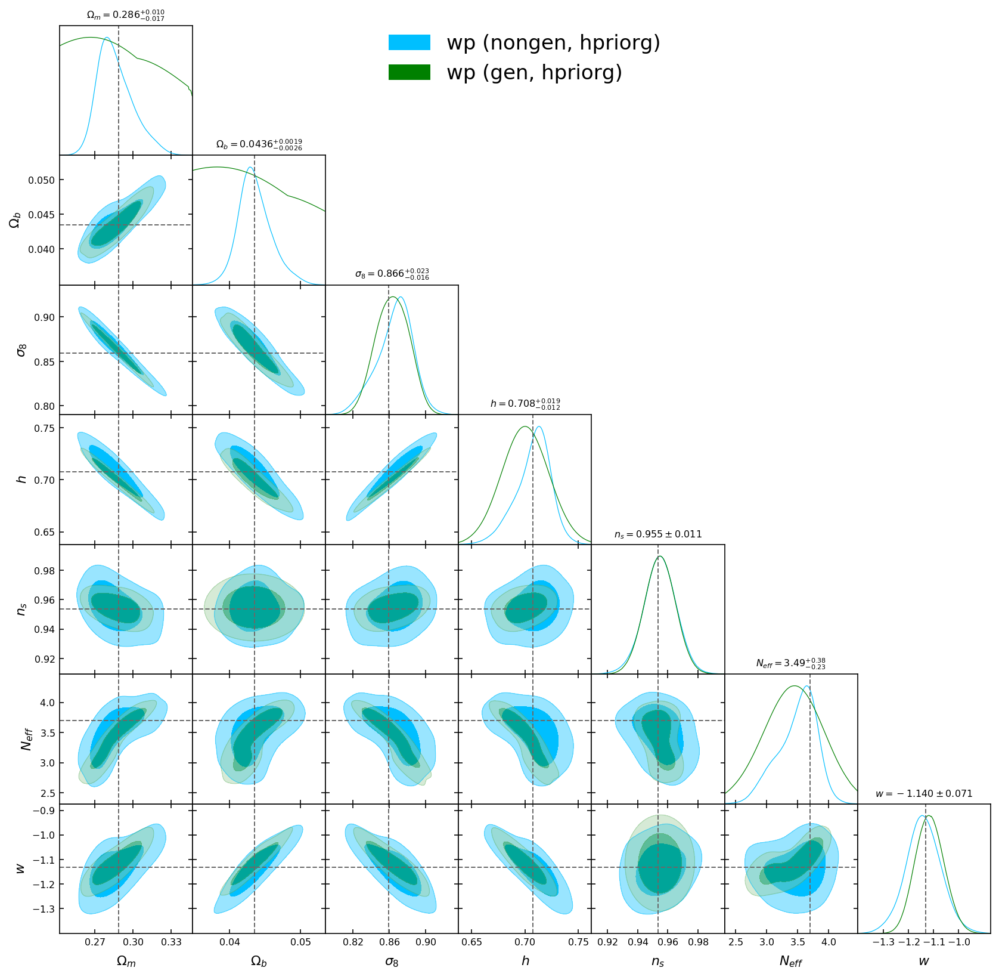

In [22]:
legend_labels = ['wp (nongen, hpriorg)',
                 'wp (gen, hpriorg)']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_gen_hpriorg']
colors = [cwp, 'green']
figure = plot_contours(chaintags, colors=colors,
                      legend_labels=legend_labels)

<HDF5 dataset "chain": shape (1, 5501, 7), type "<f4">


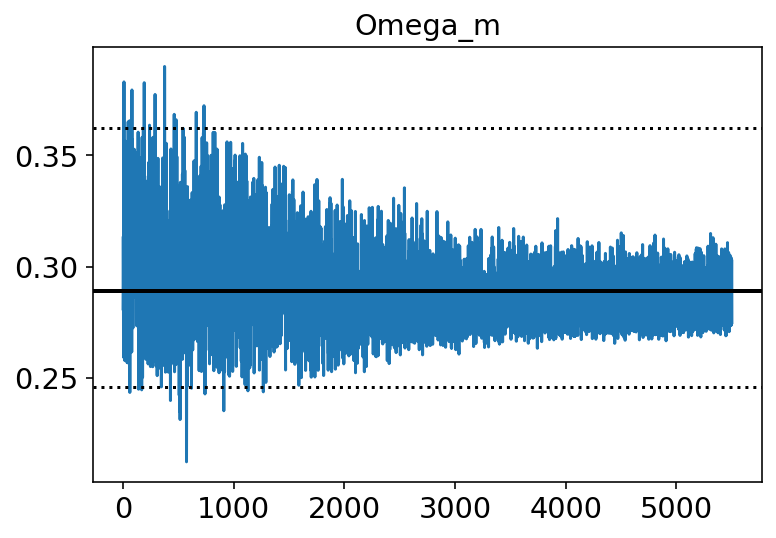

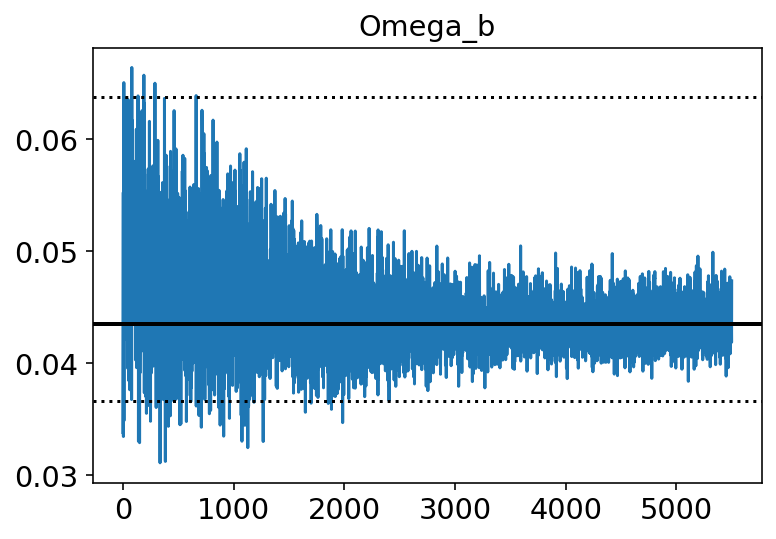

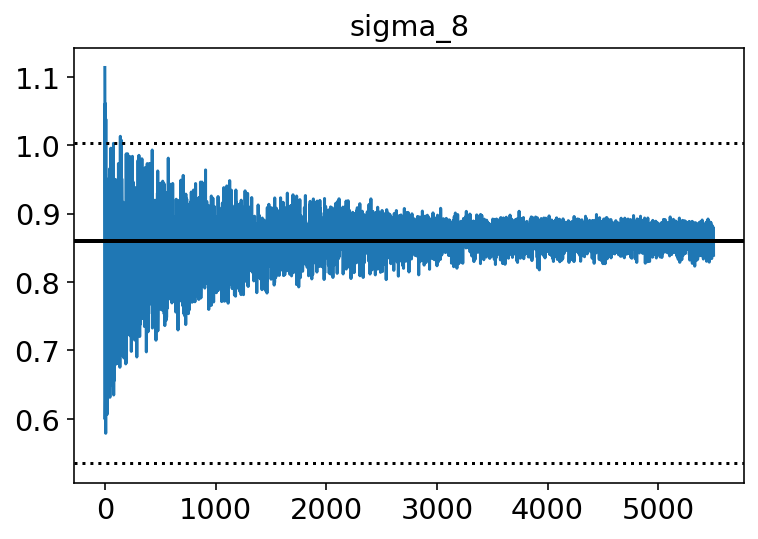

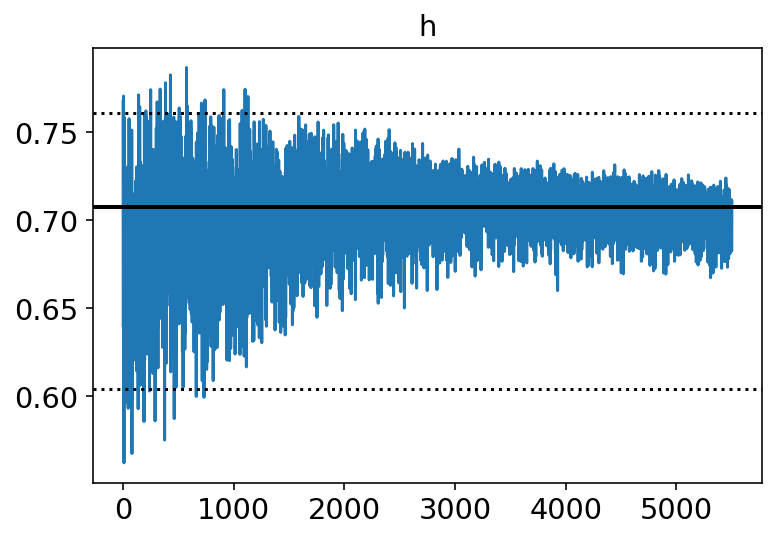

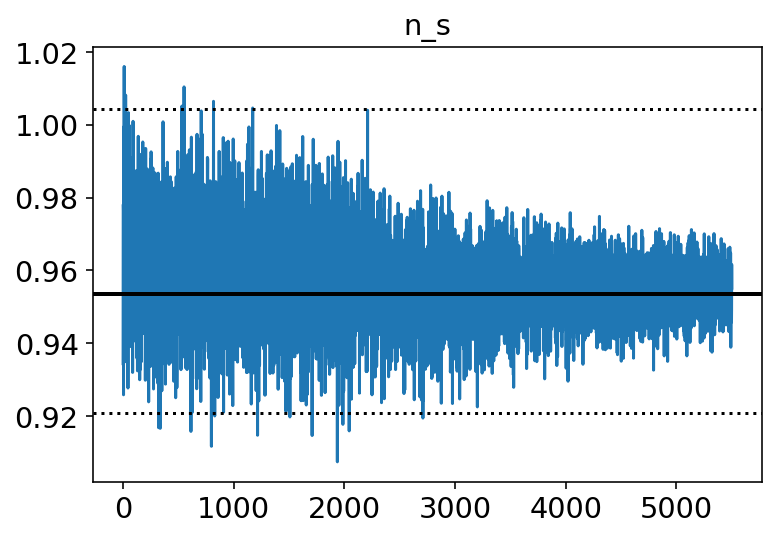

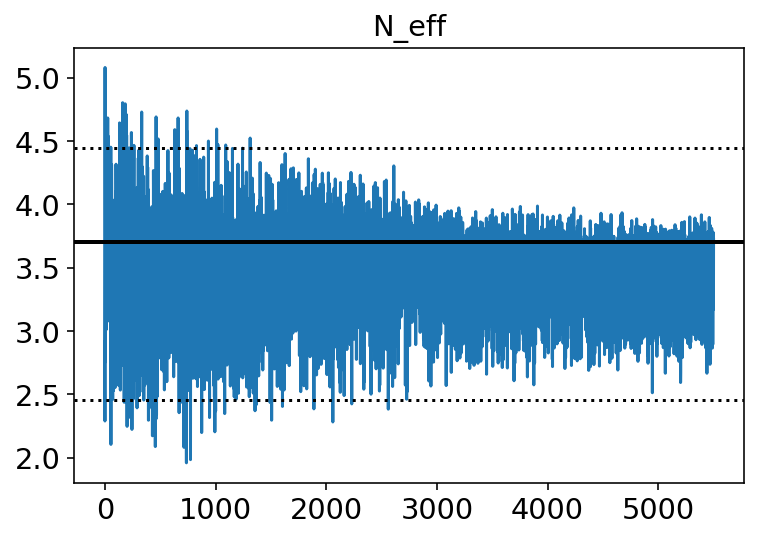

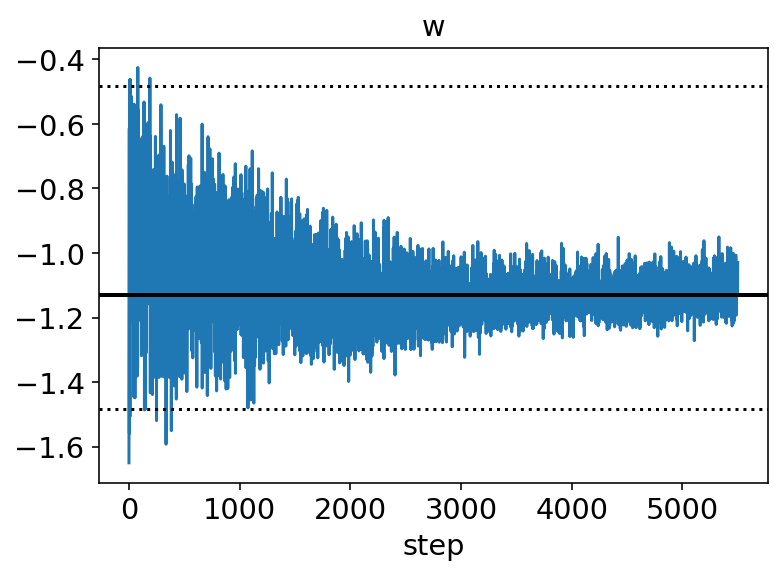

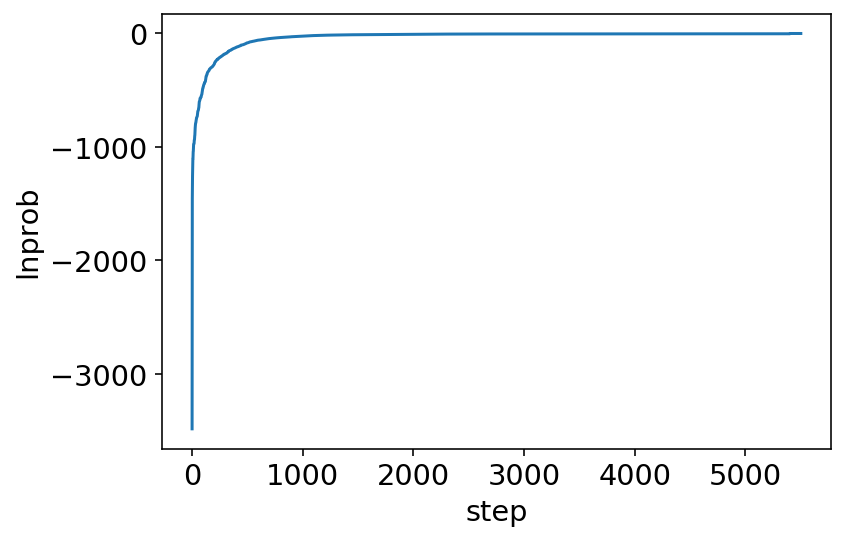

In [19]:
plot_chains('wp_c3h3_allcosmo_dynesty_dlogz1e-2_gen_hpriorg')

In [16]:
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_gen')
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_nongen')
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_gen_hpriorg')
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg')

wp_c3h3_all_dynesty_dlogz1e-2_gen: <HDF5 dataset "chain": shape (1, 11111, 18), type "<f4">
dlogz: 1e-2
seed: 12
wp_c3h3_all_dynesty_dlogz1e-2_nongen: <HDF5 dataset "chain": shape (0, 0, 18), type "<f4">
dlogz: 1e-2
seed: 12
wp_c3h3_all_dynesty_dlogz1e-2_gen_hpriorg: <HDF5 dataset "chain": shape (1, 10083, 18), type "<f4">
dlogz: 1e-2
seed: 12
wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg: <HDF5 dataset "chain": shape (1, 27912, 18), type "<f4">
dlogz: 1e-2
seed: 12


In [13]:
legend_labels = ['wp (nongen, hpriorg)',
                 'wp (gen, hpriorg)',
                 'wp (orig)']
chaintags = ['wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_c3h3_all_dynesty_dlogz1e-2_gen_hpriorg',
             'wp_c3h3_all_dynesty_dlogz001_orig']
colors = [cwp, 'green', 'orange']
figure = plot_contours(chaintags, colors=colors, params_toplot=key_params,
                      legend_labels=legend_labels)

IndexError: index 0 is out of bounds for axis 0 with size 0

2154
2350
2350
196


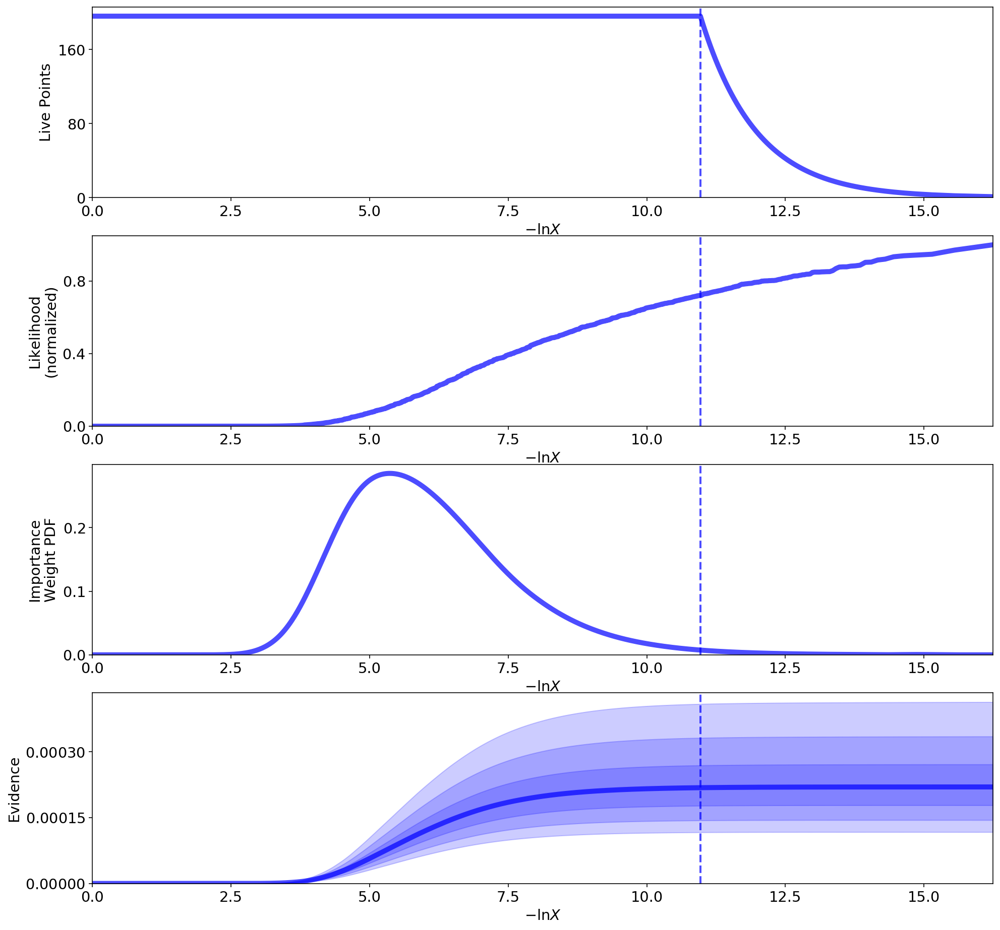

In [13]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
pickle_dir = f'../products/dynesty_results'
pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
with open(pickle_fn, 'rb') as pf:
    res = pickle.load(pf)
    print(res.niter)
    print(len(res.samples))
    print(len(res.ncall))
    print(res.nlive)
    #dyplot.cornerplot(res)
    dyplot.runplot(res)

In [17]:
check_chains('wp_c3h3_allcosmo_dynesty_dlogz1e-2_gen_hpriorg')
check_chains('wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg')

wp_c3h3_allcosmo_dynesty_dlogz1e-2_gen_hpriorg: <HDF5 dataset "chain": shape (1, 5501, 7), type "<f4">
dlogz: 1e-2
seed: 12
wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg: <HDF5 dataset "chain": shape (1, 2350, 7), type "<f4">
dlogz: 1e-2
seed: 12


In [14]:
print(res.keys())

dict_keys(['nlive', 'niter', 'ncall', 'eff', 'samples', 'samples_id', 'samples_it', 'samples_u', 'logwt', 'logl', 'logvol', 'logz', 'logzerr', 'information', 'bound', 'bound_iter', 'samples_bound', 'scale'])


In [16]:
len(res['logzerr'])

2350

In [20]:
fw = get_h5('wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg')
print(fw.keys())

<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>


In [22]:
np.array(fw['chain']).shape

(1, 2350, 7)

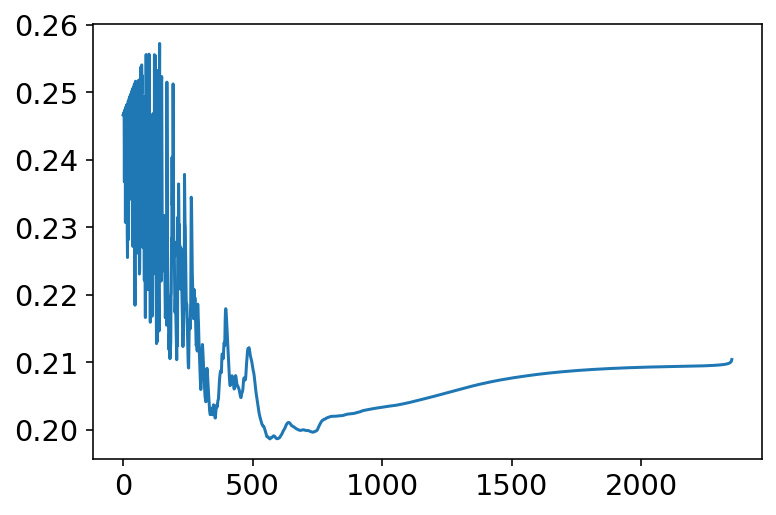

In [24]:
plt.plot(fw['varlnevidence'][0])

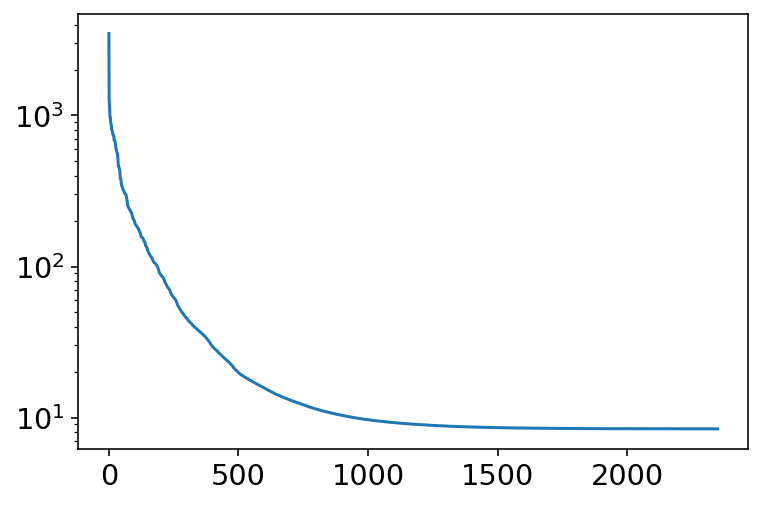

In [28]:
plt.plot(-fw['lnevidence'][0])
plt.yscale('log')

In [32]:
fw = get_h5('wp_c3h3_allcosmo_dynesty_dlogz1e-2_gen_hpriorg')
print(np.array(fw['chain']).shape)
print(fw.keys())

(1, 5501, 7)
<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>


In [35]:
np.array(fw['varlnevidence'])

array([[ 0.02761141,  0.0276194 ,  0.02762738, ..., -8.456651  ,
        -8.456636  , -8.456622  ]], dtype=float32)

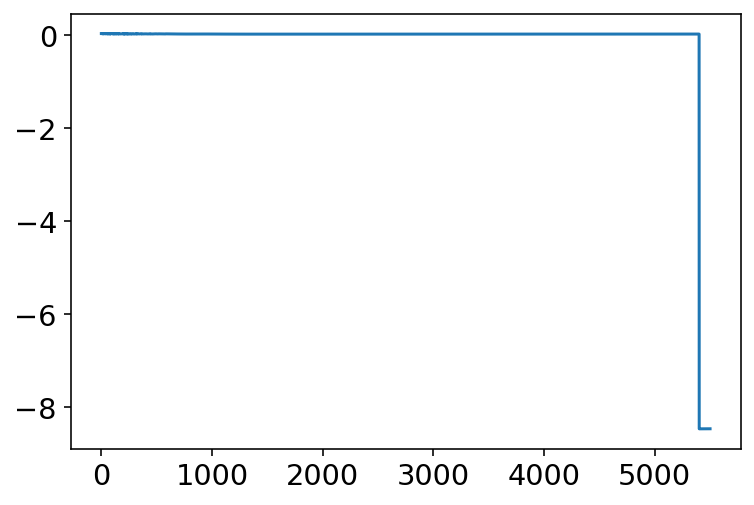

In [33]:
plt.plot(fw['varlnevidence'][0])

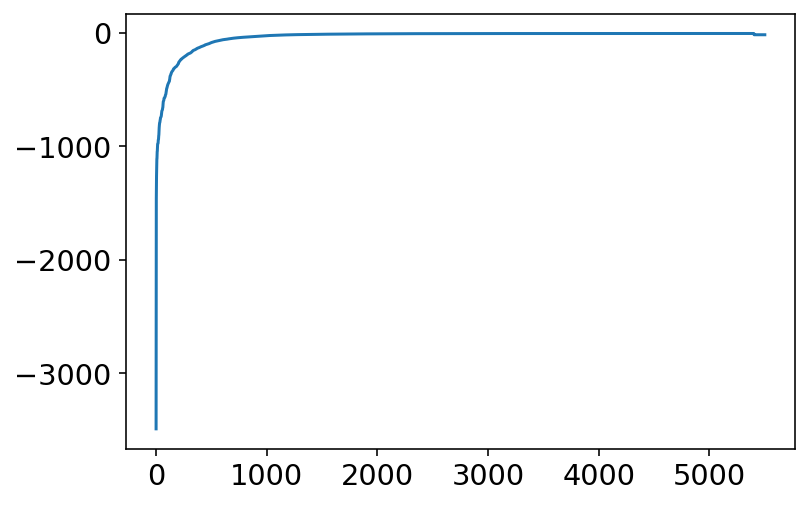

In [36]:
plt.plot(fw['lnevidence'][0])

In [ ]:
plt.plot(fw['vae'][0])

In [14]:
check_chains('wp_c3h3_omegam-sigma8_dynesty_dlogz001_origweight')

wp_c3h3_omegam-sigma8_dynesty_dlogz001_origweight: <HDF5 dataset "chain": shape (1, 5634, 2), type "<f4">
dlogz: 0.01
seed: nan


/home/users/ksf293/miniconda3/lib/python3.7/site-packages/getdist/mcsamples.py:1331: RuntimeWarning: invalid value encountered in greater
  if np.all(diffs > par.err * 1.049) and np.all(diffs < scale * 1.5):


ValueError: 'list' argument must have no negative elements

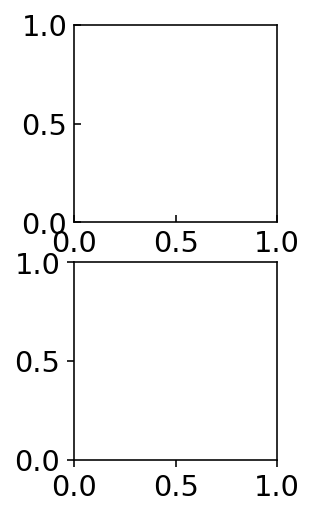

In [15]:
legend_labels = ['wp (orig)']
chaintags = ['wp_c3h3_omegam-sigma8_dynesty_dlogz001_origweight']
colors = [cwp]
figure = plot_contours(chaintags, colors=colors,
                      legend_labels=legend_labels)

<HDF5 dataset "chain": shape (1, 5634, 2), type "<f4">


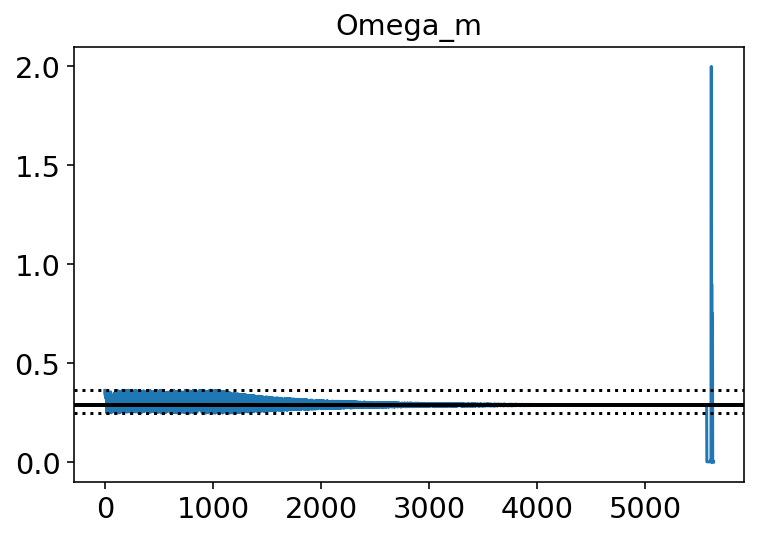

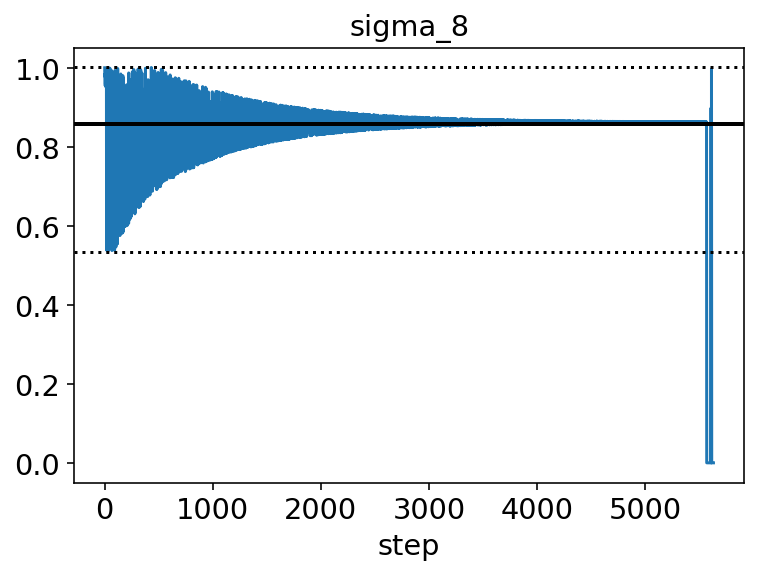

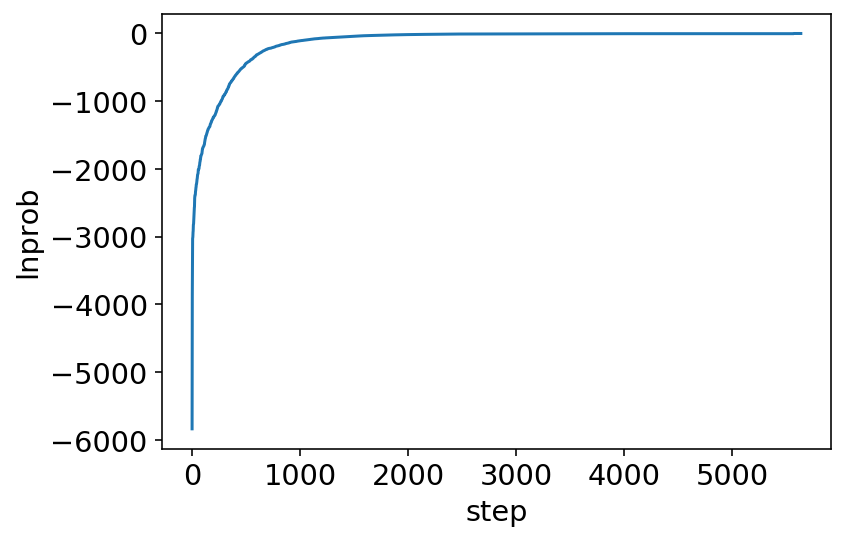

In [18]:
plot_chains(chaintags[0])

## compare results object to h5

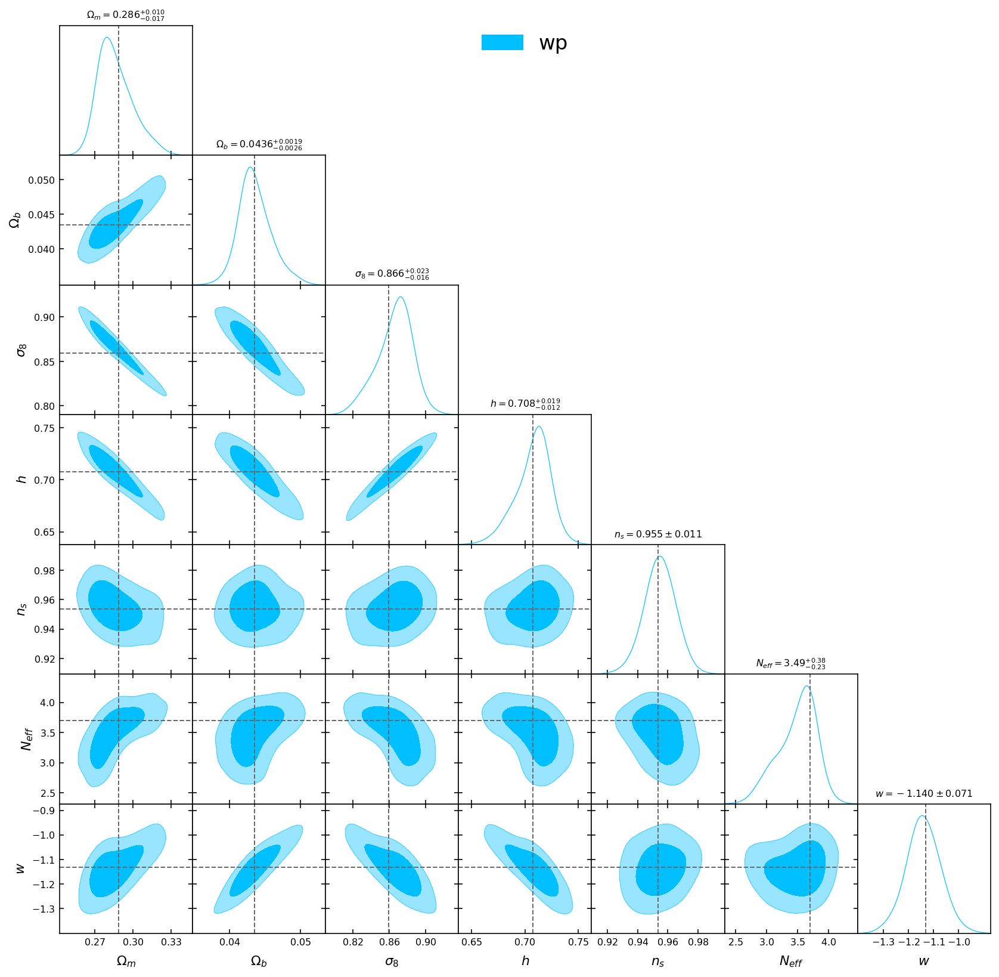

In [23]:
legend_labels = ['wp']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp]
figure = plot_contours(chaintags, colors=colors,
                      legend_labels=legend_labels)

2154
2350
2350
196


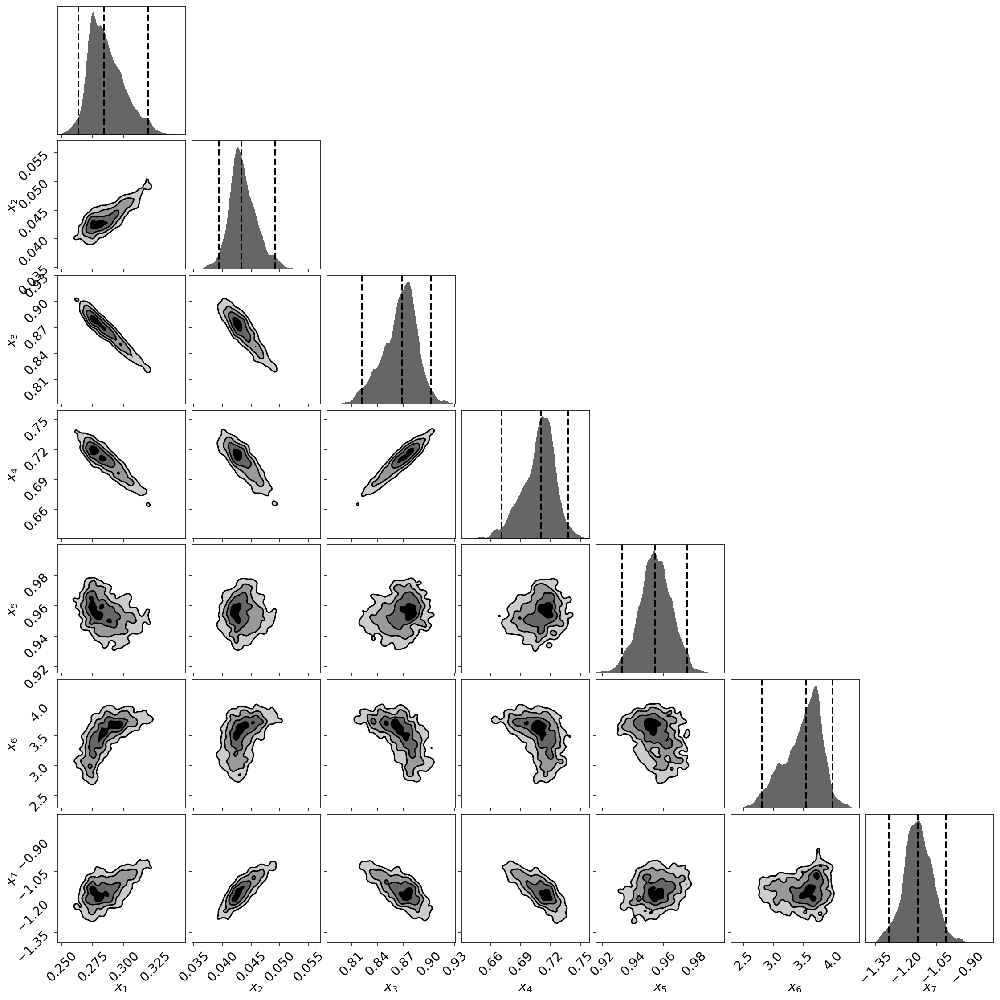

In [22]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
pickle_dir = f'../products/dynesty_results'
pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
with open(pickle_fn, 'rb') as pf:
    res = pickle.load(pf)
    print(res.niter)
    print(len(res.samples))
    print(len(res.ncall))
    print(res.nlive)
    dyplot.cornerplot(res)
    #dyplot.runplot(res)

dict_keys(['nlive', 'niter', 'ncall', 'eff', 'samples', 'samples_id', 'samples_it', 'samples_u', 'logwt', 'logl', 'logvol', 'logz', 'logzerr', 'information', 'bound', 'bound_iter', 'samples_bound', 'scale'])


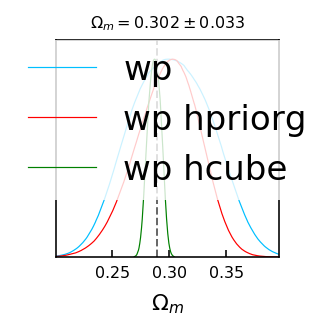

In [31]:
legend_labels = ['wp', 'wp hpriorg', 'wp hcube']
chaintags = ['wp_c3h3_omegam_dynesty_dlogz1e-1_nongen_constlike',
             'wp_c3h3_omegam_dynesty_dlogz1e-1_nongen_constlike_hpriorg',
             'wp_c3h3_omegam_dynesty_dlogz1e-1_nongen_consthcubelike']
colors = [cwp, 'red', 'green']
figure = plot_contours(chaintags, colors=colors,
                      legend_labels=legend_labels)

<HDF5 dataset "chain": shape (1, 337, 1), type "<f4">


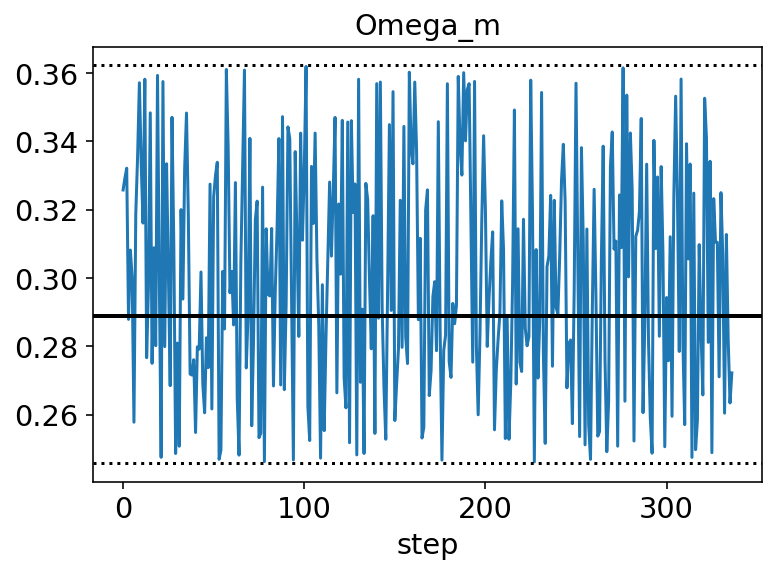

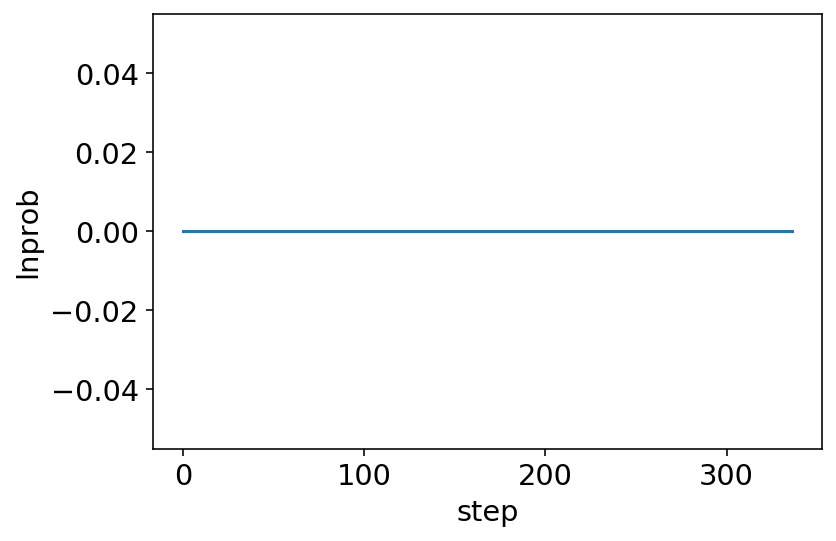

In [29]:
plot_chains('wp_c3h3_omegam_dynesty_dlogz1e-1_nongen_constlike')

<HDF5 dataset "chain": shape (1, 337, 1), type "<f4">


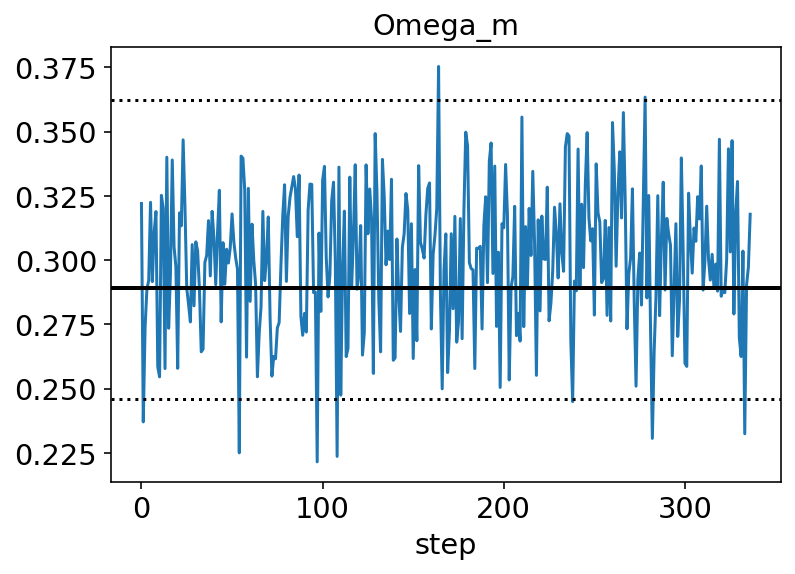

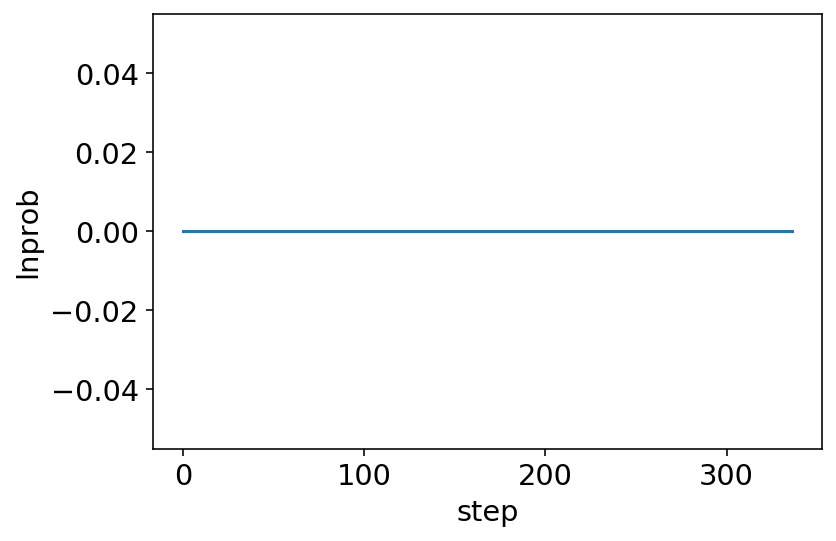

In [30]:
plot_chains('wp_c3h3_omegam_dynesty_dlogz1e-1_nongen_constlike_hpriorg')

<HDF5 dataset "chain": shape (1, 426, 1), type "<f4">


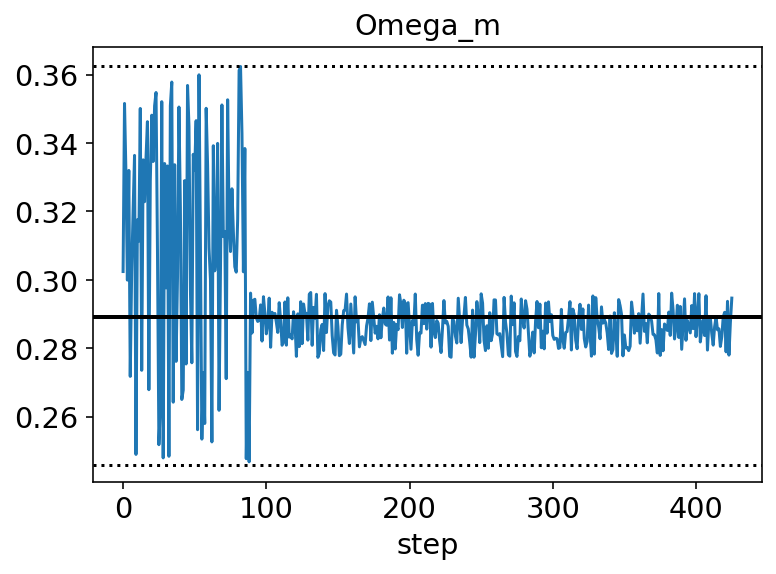

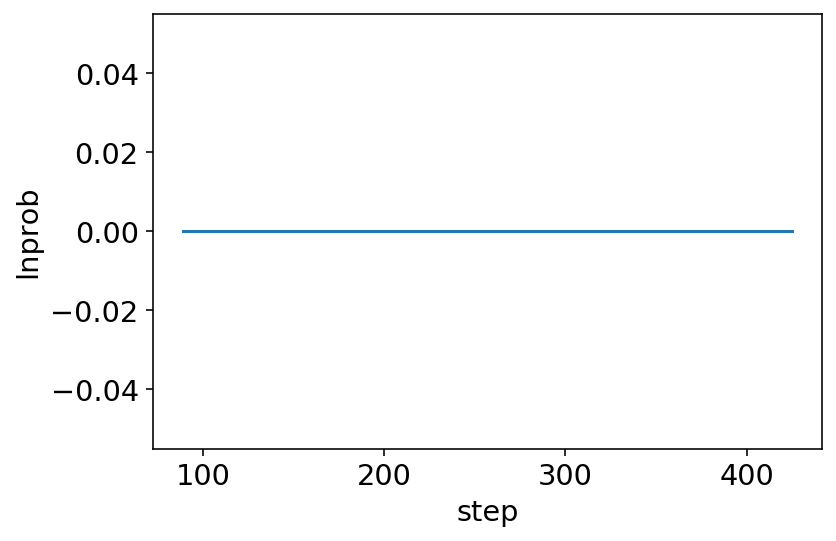

In [34]:
plot_chains('wp_c3h3_omegam_dynesty_dlogz1e-1_nongen_consthcubelike')

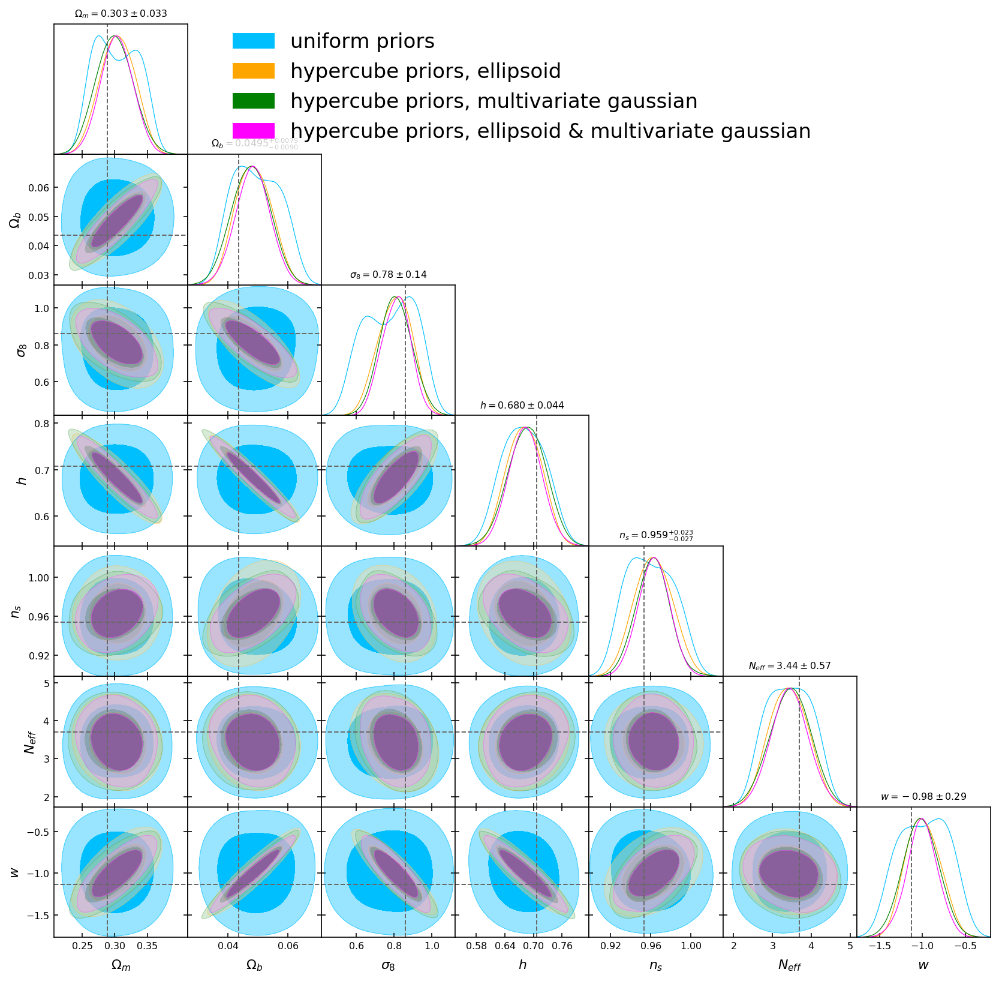

In [39]:
# PRIOR ONLY
legend_labels = ['uniform priors',
                 'hypercube priors, ellipsoid',
                 'hypercube priors, multivariate gaussian',
                 'hypercube priors, ellipsoid & multivariate gaussian']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_constlike',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_consthcubelike',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_constlike_hpriorg',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_consthcubelike_hpriorg']
colors = [cwp, 'orange', 'green', 'magenta']
figure = plot_contours(chaintags, colors=colors,
                      legend_labels=legend_labels)

2126
2322
2322
196


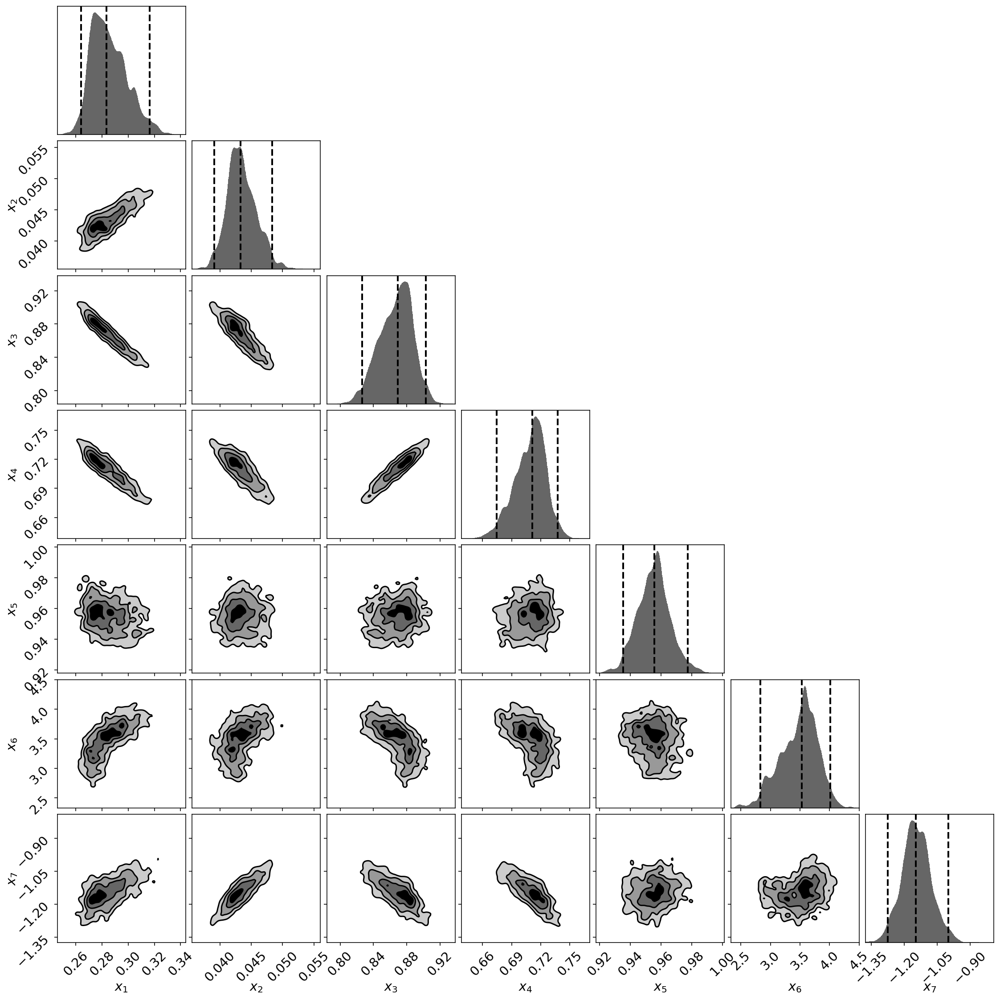

In [37]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_genres'
pickle_dir = f'../products/dynesty_results'
pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
with open(pickle_fn, 'rb') as pf:
    res = pickle.load(pf)
    print(res.niter)
    print(len(res.samples))
    print(len(res.ncall))
    print(res.nlive)
    dyplot.cornerplot(res)
    #dyplot.runplot(res)

In [41]:
print(res.keys())

dict_keys(['nlive', 'niter', 'ncall', 'eff', 'samples', 'samples_id', 'samples_it', 'samples_u', 'logwt', 'logl', 'logvol', 'logz', 'logzerr', 'information', 'bound', 'bound_iter', 'samples_bound', 'scale'])


<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
2350 7
(2350, 7) (2350,)
<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
2350 7
(2350, 7) (2350,)


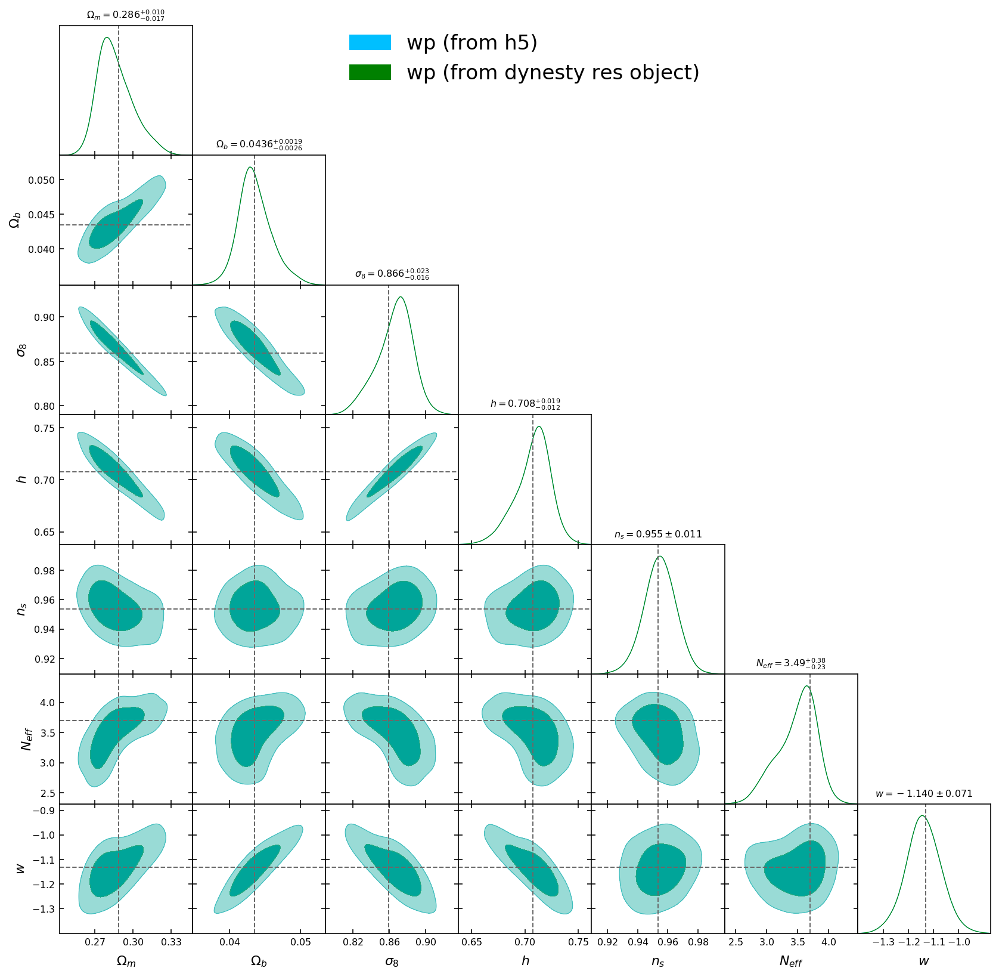

In [73]:
# checking that plotting from res is same
legend_labels = ['wp (from h5)', 'wp (from dynesty res object)']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp, 'green']
figure = plot_contours_resample(chaintags, colors=colors, use_res=[False, True],
                      legend_labels=legend_labels)

<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
2322 7
(2322, 7) (2322,)


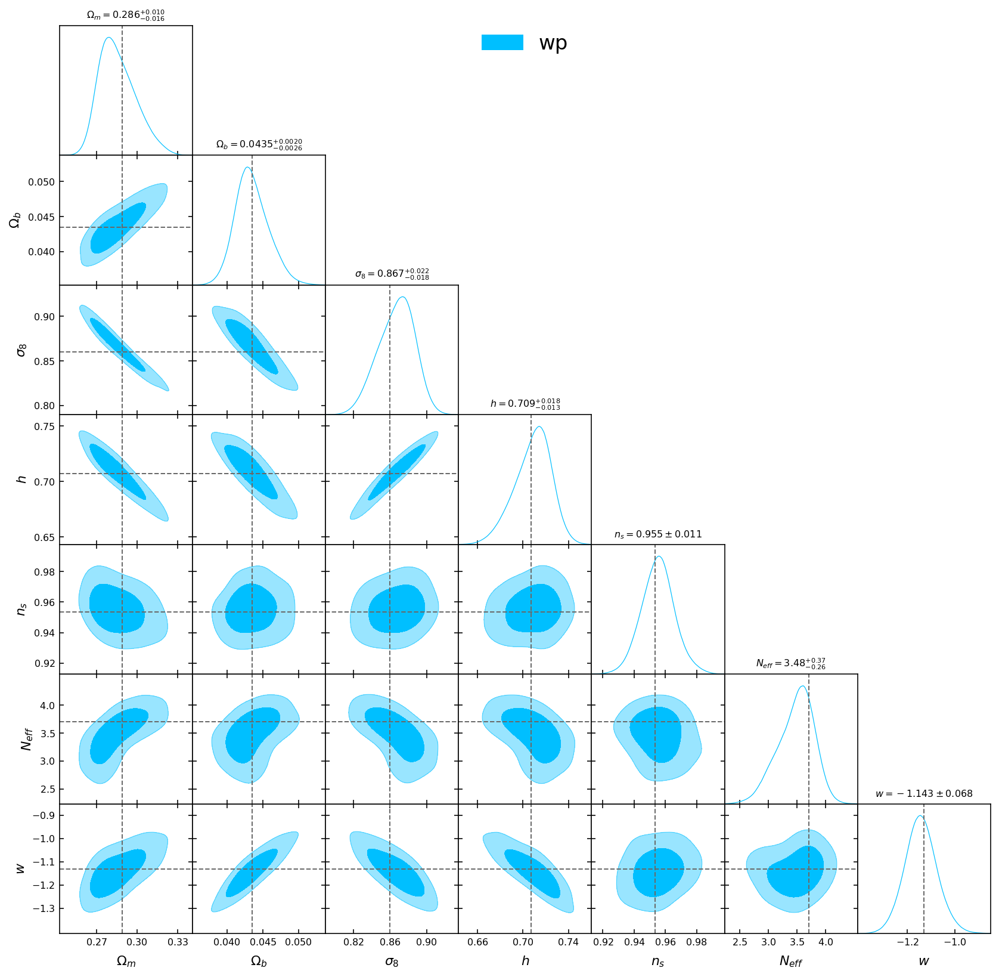

In [77]:
legend_labels = ['wp']
chaintags = ['wp_c3h3_allcosmo_dynesty_dlogz1e-2_genres']
colors = [cwp]
figure = plot_contours_resample(chaintags, colors=colors, use_res=[True],
                      legend_labels=legend_labels)

In [18]:
check_chains('wp_c3h3_all_dynesty_dlogz1e-2_gen_ressave')

wp_c3h3_all_dynesty_dlogz1e-2_gen_ressave: <HDF5 dataset "chain": shape (1, 1500, 18), type "<f4">
dlogz: 1e-2
seed: 12


<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
28297 7
(28297, 7) (28297,)


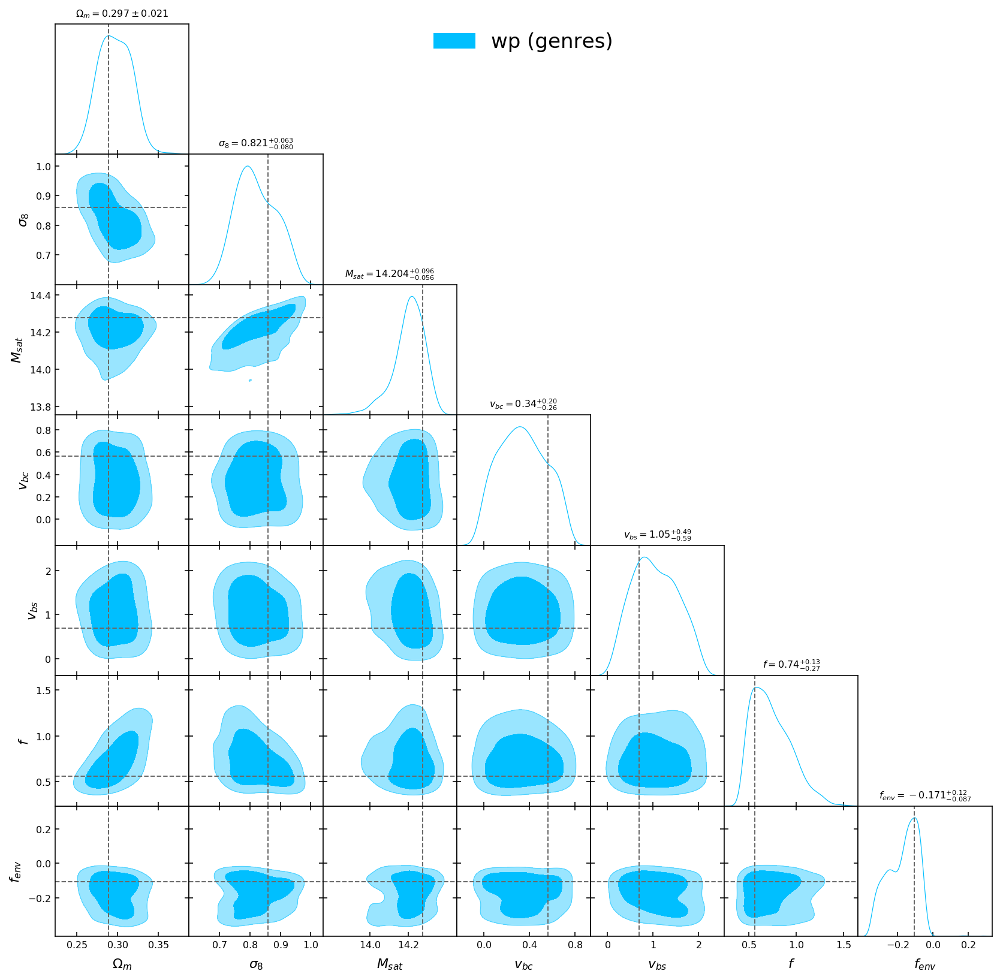

In [23]:
# checking that plotting from res is same
legend_labels = ['wp (genres)']
chaintags = ['wp_c3h3_all_dynesty_dlogz1e-2_genres']
colors = [cwp]
figure = plot_contours_resample(chaintags, colors=colors, use_res=[True], params_toplot=key_params,
                      legend_labels=legend_labels)

<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
49532 7
(49532, 7) (49532,)
<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
48290 7
(48290, 7) (48290,)


MCSamplesError: Parameter range is <= 0: Omega_m

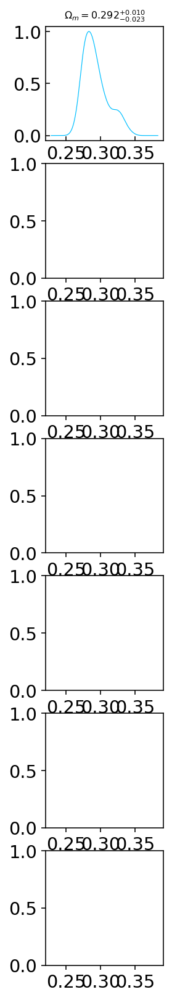

In [14]:
# checking that plotting from res is same
legend_labels = ['wp + xi + upf + mcf (nongen, nlive=1296)',
                 #'wp + xi + upf + mcf (gen, nlive=1296)',
                 'wp + xi + upf + mcf (gen, nlive=500)']
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             #'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_gen_hpriorg_nliveadapt',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_gen_hpriorg']
colors = [cwp, 'green', 'magenta']
figure = plot_contours_resample(chaintags, colors=colors, use_res=[False, False, False],
                      legend_labels=legend_labels, params_toplot=key_params)

<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
49532 7
(49532, 7) (49532,)


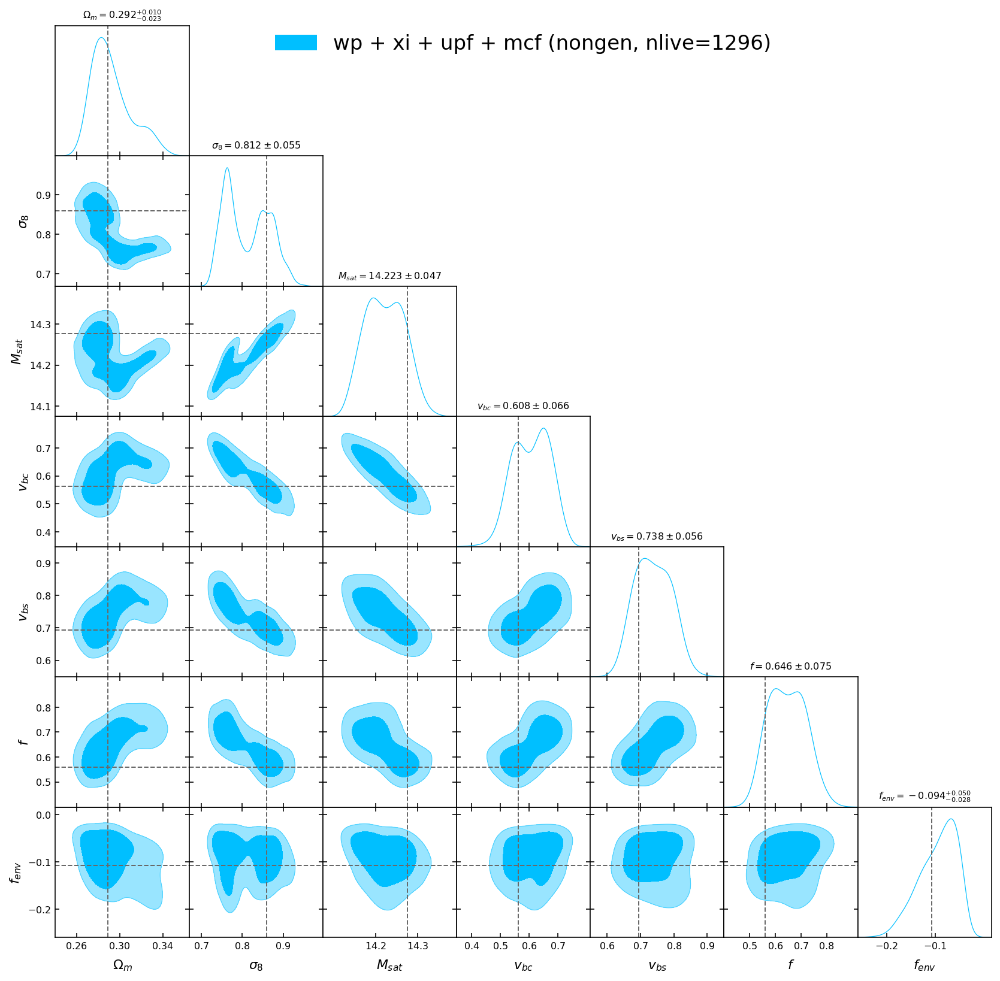

In [15]:
# checking that plotting from res is same
legend_labels = ['wp + xi + upf + mcf (nongen, nlive=1296)']
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp, 'green', 'magenta']
figure = plot_contours_resample(chaintags, colors=colors, use_res=[False],
                      legend_labels=legend_labels, params_toplot=key_params)

<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
49532 7
(49532, 7) (49532,)


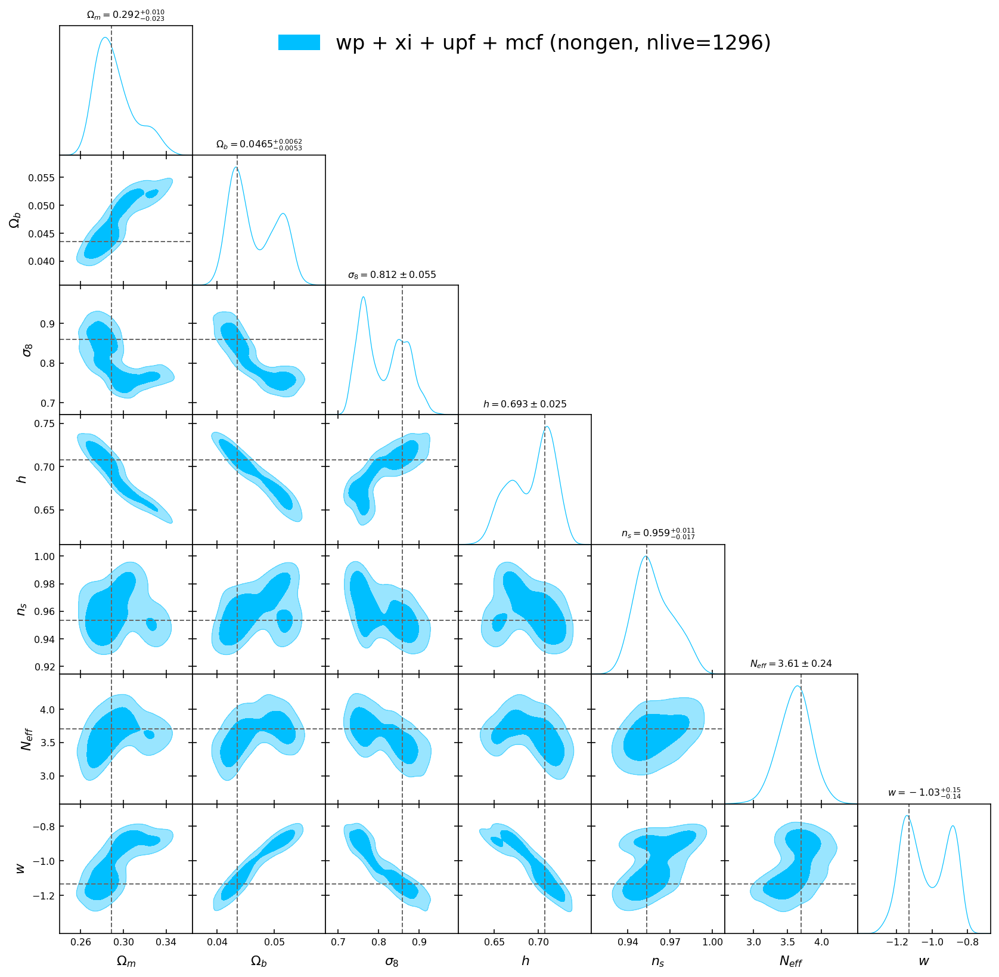

In [18]:
# checking that plotting from res is same
legend_labels = ['wp + xi + upf + mcf (nongen, nlive=1296)']
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg']
colors = [cwp, 'green', 'magenta']
figure = plot_contours_resample(chaintags, colors=colors, use_res=[False],
                      legend_labels=legend_labels, params_toplot=cosmo_params)

<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
3143 7
(3143, 7) (3143,)
<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
49532 7
(49532, 7) (49532,)


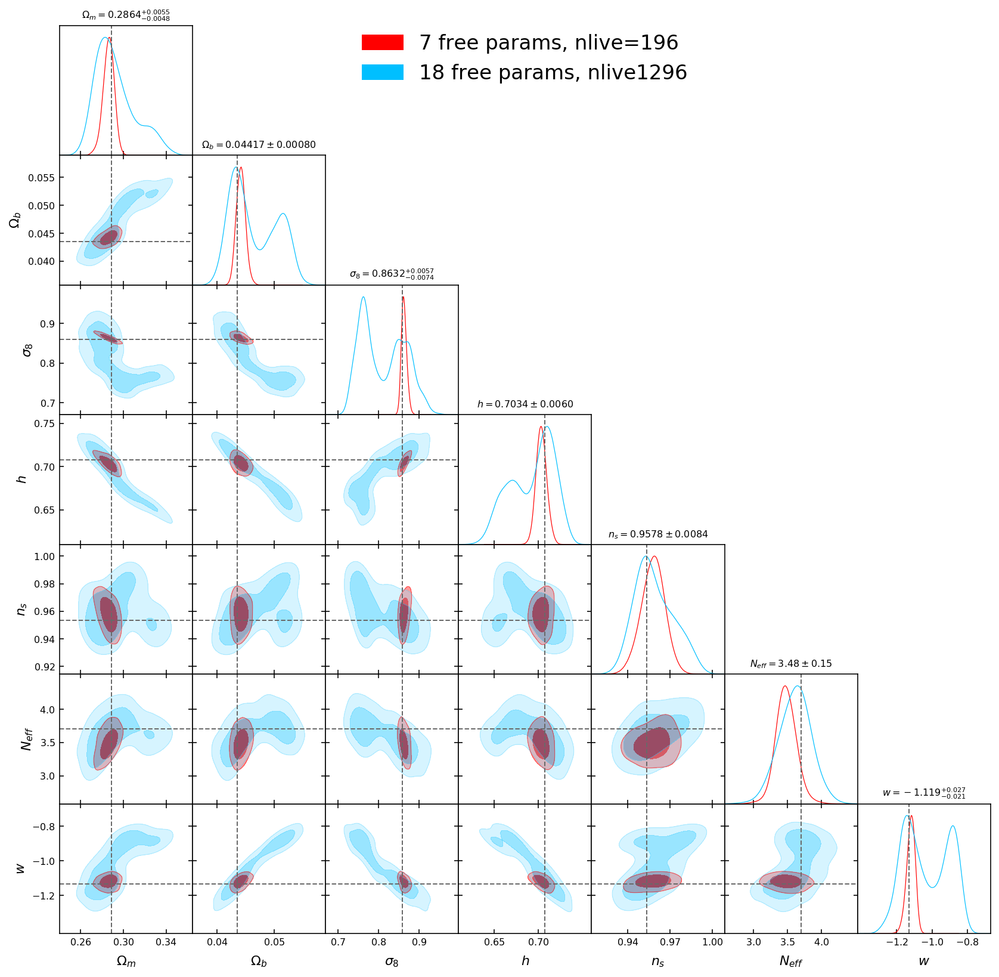

In [23]:
# checking that plotting from res is same
legend_labels = ['7 free params, nlive=196',
                 '18 free params, nlive1296']
chaintags = ['wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg']
colors = ['red', cwp]
figure = plot_contours_resample(chaintags, colors=colors, use_res=[False, False],
                      legend_labels=legend_labels, params_toplot=cosmo_params)

<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
3143 7
(3143, 7) (3143,)
<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
27912 7
(27912, 7) (27912,)
<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
49532 7
(49532, 7) (49532,)


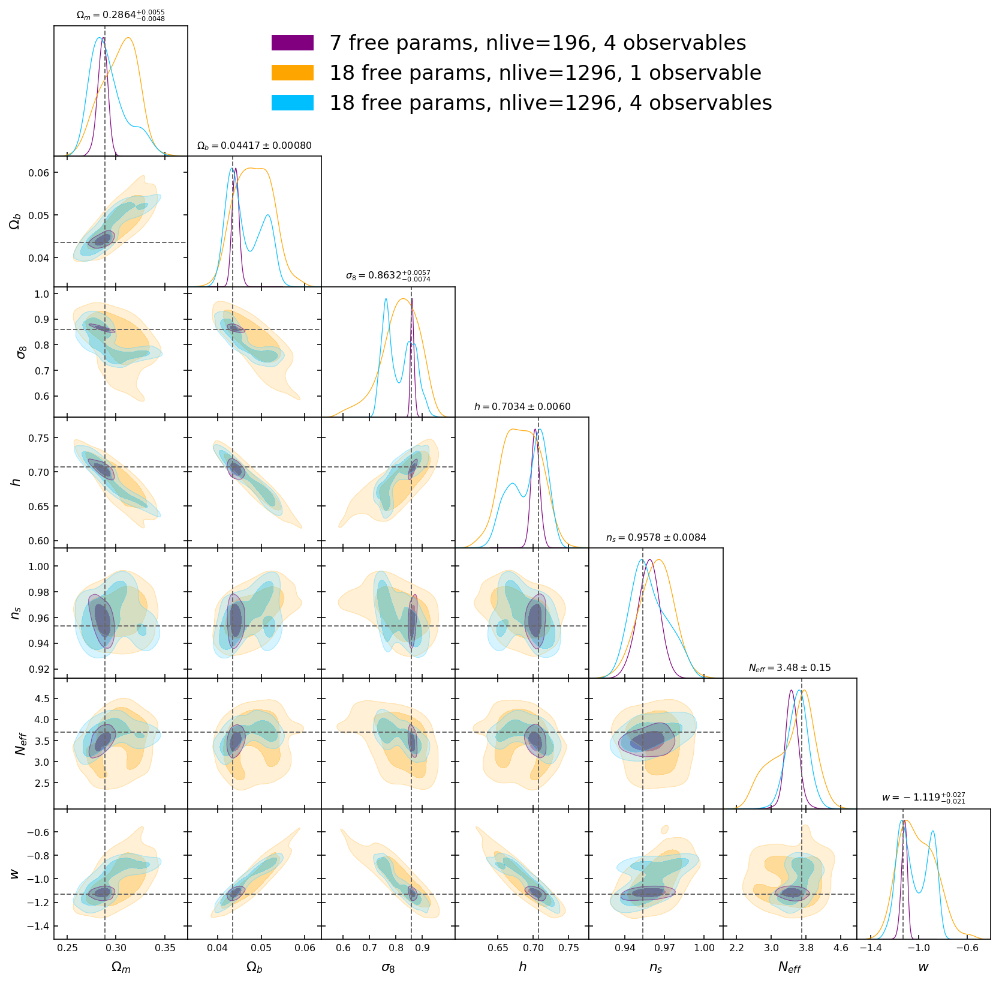

In [27]:
# checking that plotting from res is same
legend_labels = ['7 free params, nlive=196, 4 observables',
                 '18 free params, nlive=1296, 1 observable',
                 '18 free params, nlive=1296, 4 observables',
                ]
chaintags = ['wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             ]
colors = ['purple', 'orange', cwp]
figure = plot_contours_resample(chaintags, colors=colors, use_res=[False, False, False],
                      legend_labels=legend_labels, params_toplot=cosmo_params)

<KeysViewHDF5 ['chain', 'lnevidence', 'lnprob', 'lnweight', 'varlnevidence']>
<KeysViewHDF5 ['cosmo', 'dlogz', 'errtag', 'hod', 'kernel_name', 'log', 'mean', 'multi', 'nburn', 'nhod', 'nsteps', 'nwalkers', 'param_names', 'seed', 'statistic', 'tag', 'testtag', 'traintag', 'true_values']>
49532 7
(49532, 7) (49532,)


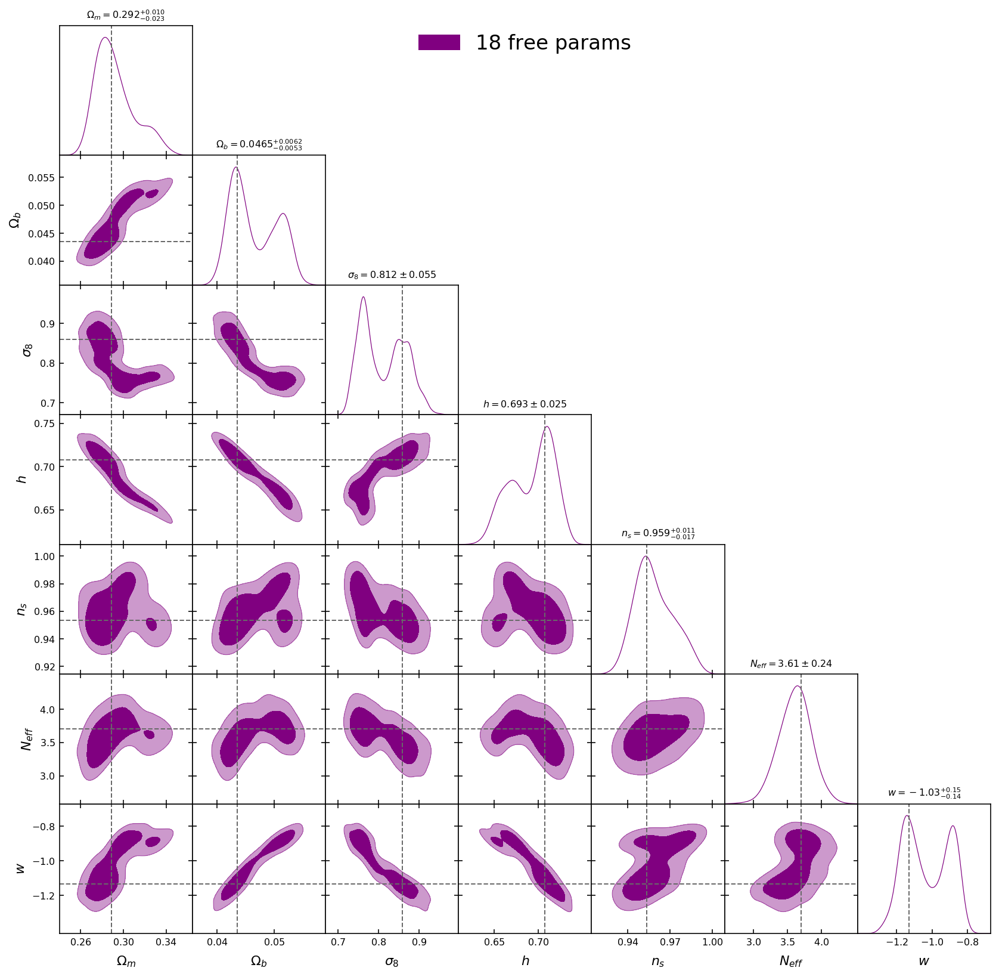

In [18]:
legend_labels = ['18 free params'
                ]
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             ]
colors = ['purple', 'magenta']
figure = plot_contours_resample(chaintags, colors=colors, use_res=[True],
                      legend_labels=legend_labels, params_toplot=cosmo_params)

In [ ]:
# checking that plotting from res is same
legend_labels = ['all free params, dynesty',
                 'all free params, emcee (250 walkers, ~10k steps)',
                ]
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_emcee_hpriore',
             ]
colors = [cwp, 'green']
figure = plot_contours_resample(chaintags, colors=colors, use_res=[False, False],
                      legend_labels=legend_labels, params_toplot=cosmo_params)